In [2]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats, special, linalg
%config Completer.use_jedi = False
import healpy as hp
import tqdm
%config InlineBackend.figure_format = 'retina'
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 200
%load_ext autoreload
%autoreload 2

In [77]:
np.exp(-np.log(2)*np.exp(-5))

0.9953405003423349

In [78]:
special.expit(5)

0.9933071490757153

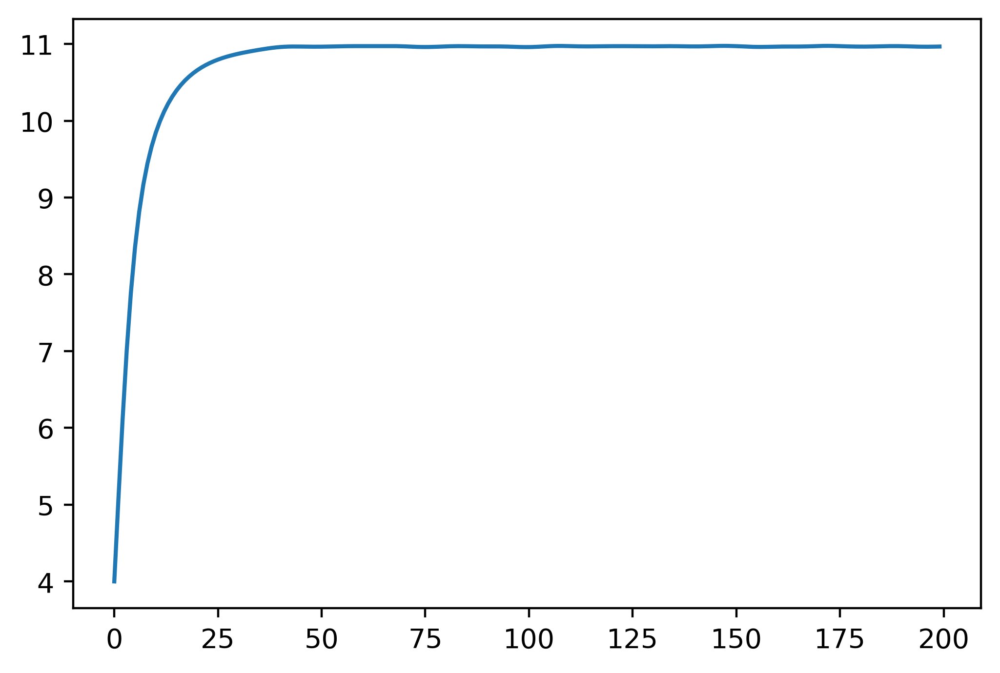

In [76]:
x = np.arange(0,200)
l = 3
D = x[:,np.newaxis]-x[np.newaxis,:]
K = np.exp(-0.5*np.square(D/l))
L = np.linalg.cholesky(K)
R = np.linalg.inv(L)
z = 4.0*np.ones(200)
plt.plot(np.dot(L,z))

In [ ]:
_data = pd.read_csv('../../global_data/CommandedScanLaw_001.csv')
_columns = ['jd_time', 'ra_fov1', 'dec_fov1', 'ra_fov2', 'dec_fov2']
_keys = ['tcb_at_gaia', 'ra_fov_1', 'dec_fov_1', 'ra_fov_2', 'dec_fov_2']
_box = {}
_order = np.argsort(_data['jd_time'].values)
for j,k in zip(_columns,_keys):
    _box[k] = _data[j].values[_order]
del _data
print('There are',_box['tcb_at_gaia'].size,'time points.')

In [38]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy import special
import healpy as hp

# Load in parameters
root_directory = '/Users/douglasboubert/Science/gaia-selection-function/Gaia-EDR3-selection-function/Python/data/'

tbeg, tend = 1717.6256+(np.linspace(1666.4384902198801, 2704.3655735533684, 2) + 2455197.5 - 2457023.5 - 0.25)*4
class diagnostic:
    def __init__(self,name,epoch):
        params = pd.read_csv(root_directory+name+'/Optimiser_Properties.dat',skipinitialspace=True)
        self.Nt = int(params['Nt'][0])
        self.Nm = int(params['Nm'][0])
        self.Nl = int(params['Nl'][0])
        self.NT = 8967691
        self.healpix_order = int(params['healpix_order'][0])
        self.name = name
        self.epoch = epoch

        # Hacky fix
        if name == 'Diagnostic3_mum0_mut0_sigmat3_lt36_space54':
            self.Nl = int(self.Nl/4)
            self.healpix_order -= 1

        # Load in scanning law
        scl_to_healpix = pd.read_csv(root_directory+f'ScanningLaw/scanninglaw_to_healpix_{self.healpix_order}.csv')
        fov_1_hpx, fov_2_hpx = scl_to_healpix['fov_1_hpx'].values, scl_to_healpix['fov_2_hpx'].values
        del scl_to_healpix

        # Load in transformed parameters
        self.t = np.linspace(tbeg,tend,self.Nt)
        self.T = np.linspace(tbeg,tend,self.NT)
        if epoch == 'final':
            file = '/FinalPosition_TransformedParameters.dat'
        else:
            file = f'/TempPositions/TempPosition{epoch}_TransformedParameters.dat'
        _data = pd.read_csv(root_directory+name+file,header=None)[0].values
        self.xt = _data[:self.Nt]
        self.xml = np.reshape(_data[self.Nt:],(self.Nl,self.Nm)).T

        mag_idx = 142
        a = -3.0
        alpha = 0.5*np.log(2)
        print(np.arange(1.7,23.05,0.1)[mag_idx])
        
        x1, x2 = self.xml[mag_idx,fov_1_hpx], self.xml[mag_idx,fov_2_hpx]
        y1, y2 = np.exp(-x1), np.exp(-x2)
        y1[x1 < a] = (1.0+a-x1[x1 < a])*np.exp(-a)
        y2[x2 < a] = (1.0+a-x2[x2 < a])*np.exp(-a)
        self.pmT = np.exp(-alpha*(y1+y2))
        time_mapper = np.round(np.arange(self.NT)*self.Nt/self.NT)
        time_mapper[time_mapper == self.Nt] -=1
        time_mapper = time_mapper.astype(int)
        self.pt = special.expit(self.xt)
        self.pT = self.pt[time_mapper]
        self.PT = self.pT*self.pmT


In [39]:
diag3 = diagnostic('Diagnostic3_mum0_mut0_sigmat3_lt36_space54',235)
#Nt, xt_65 = load_dataset('Diagnostic4_mum0_mut0_sigmat3_lt36_space65',50)
diag9 = diagnostic('Diagnostic9_truncatedInput','final')




15.900000000000013
15.900000000000013


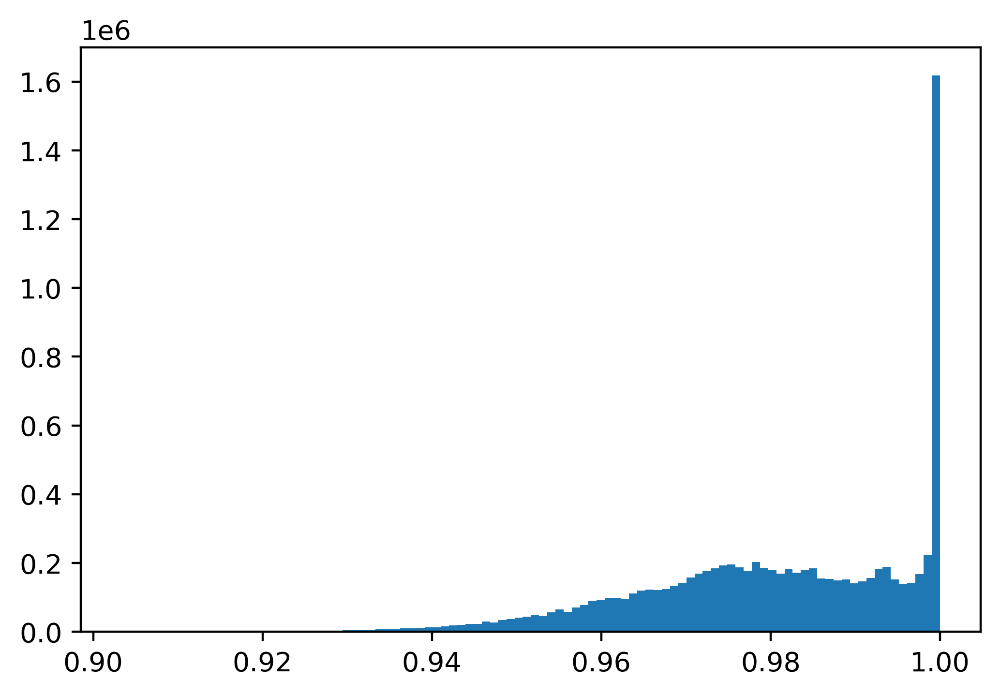

In [49]:
plt.hist(diag9.pmT,100);

(2320.0, 2326.0)

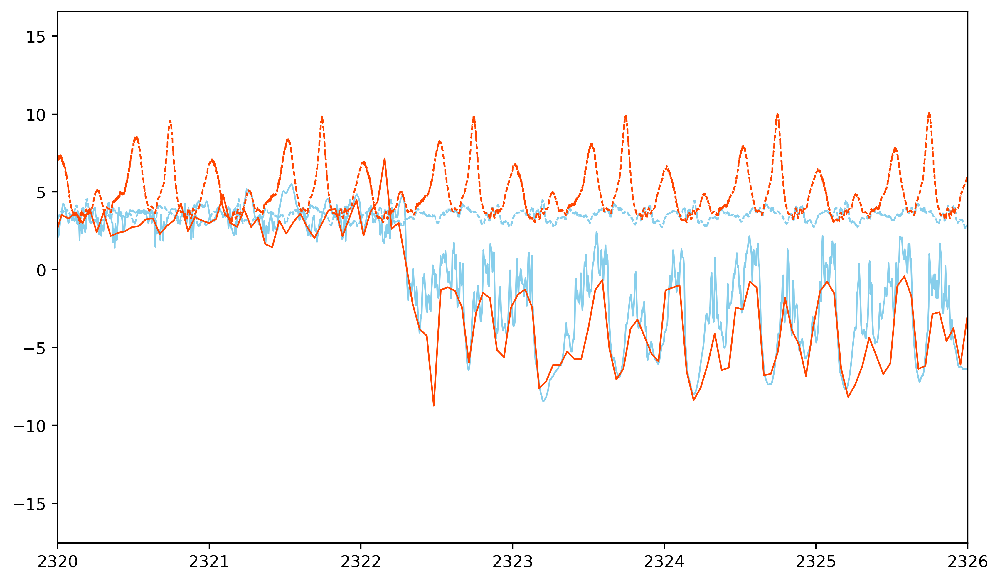

In [46]:
plt.figure(figsize=(10,6))
plt.plot(diag3.t,diag3.xt,lw=1,color='skyblue')
plt.plot(diag3.T,special.logit(diag3.pmT),lw=1,color='skyblue',ls='--')
plt.plot(diag9.t,diag9.xt,lw=1,color='orangered')
plt.plot(diag9.T,special.logit(diag9.pmT),lw=1,color='orangered',ls='--')
#plt.xlim([1384,1386])
plt.xlim([2320,2326])
#plt.savefig('./tmp.png',dpi=300,facecolor='w',bbox_inches='tight')

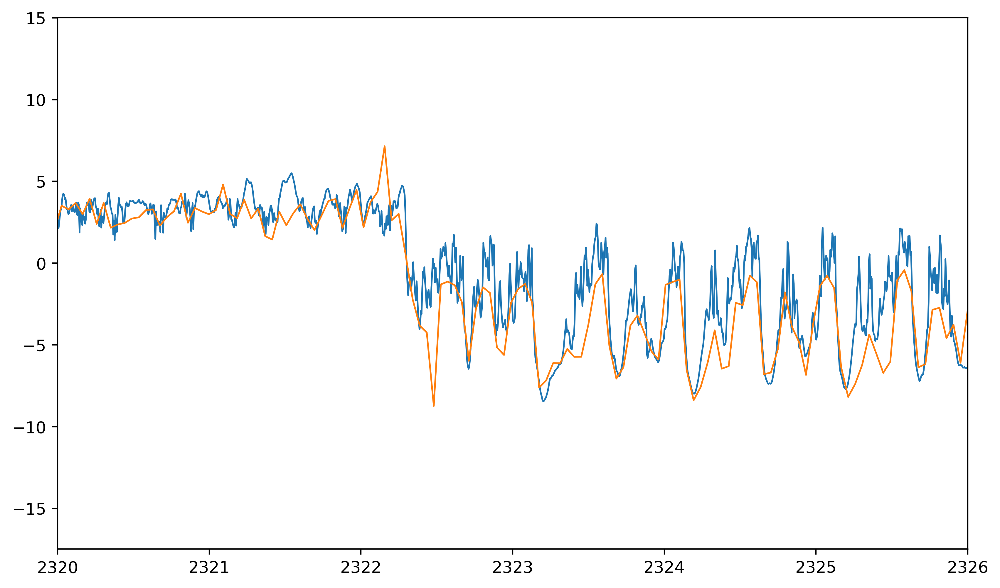

In [40]:
plt.figure(figsize=(10,6))
plt.plot(diag3.t,diag3.xt,lw=1)
plt.plot(diag9.t,diag9.xt,lw=1)
#plt.xlim([1384,1386])
plt.xlim([2320,2326])
plt.savefig('./tmp.png',dpi=300,facecolor='w',bbox_inches='tight')

In [12]:
from scipy import stats
from scipy.signal import savgol_filter
yhat = savgol_filter(y, 51, 3)
r, p = stats.pearsonr(xt_54, xt_new)
print(f"Scipy computed Pearson r: {r} and p-value: {p}")

ValueError: x and y must have the same length.

In [22]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy import special
import healpy as hp

# Load in parameters
#directory = '/mnt/extraspace/GaiaSelectionFunction/Code/C++/Test/SlimTest/'
directory = '/Users/douglasboubert/Science/gaia-selection-function/Gaia-EDR3-selection-function/Python/data/Mut0Test2/'
params = pd.read_csv(directory+'Optimiser_Properties.dat',skipinitialspace=True)
Nt = int(params['Nt'][0])
Nm = int(params['Nm'][0])
Nl = int(params['Nl'][0])
NT = 8967691
healpix_order = int(params['healpix_order'][0])

# Load in gaps
gaps = pd.read_csv('/Users/douglasboubert/Science/gaia-selection-function/Gaia-EDR3-selection-function/Python/data/edr3_gaps.csv')

# Load in transformed parameters
file = 'TempPositions/TempPosition40_TransformedParameters.dat'
#file = 'FinalPosition_TransformedParameters.dat'
xt = pd.read_csv(directory+file,header=None)[0][:Nt].values
xml = np.reshape(pd.read_csv(directory+file,header=None)[0][Nt:].values,(Nl,Nm)).T

# Load in transformed parameters
file = f'scanninglaw_to_healpix_{healpix_order}.csv'
scl_to_healpix = pd.read_csv(directory+file)

fov_1_hpx, fov_2_hpx = scl_to_healpix['fov_1_hpx'].values, scl_to_healpix['fov_2_hpx'].values
del scl_to_healpix

In [50]:
params['l_t']

0    192
Name: l_t, dtype: int64

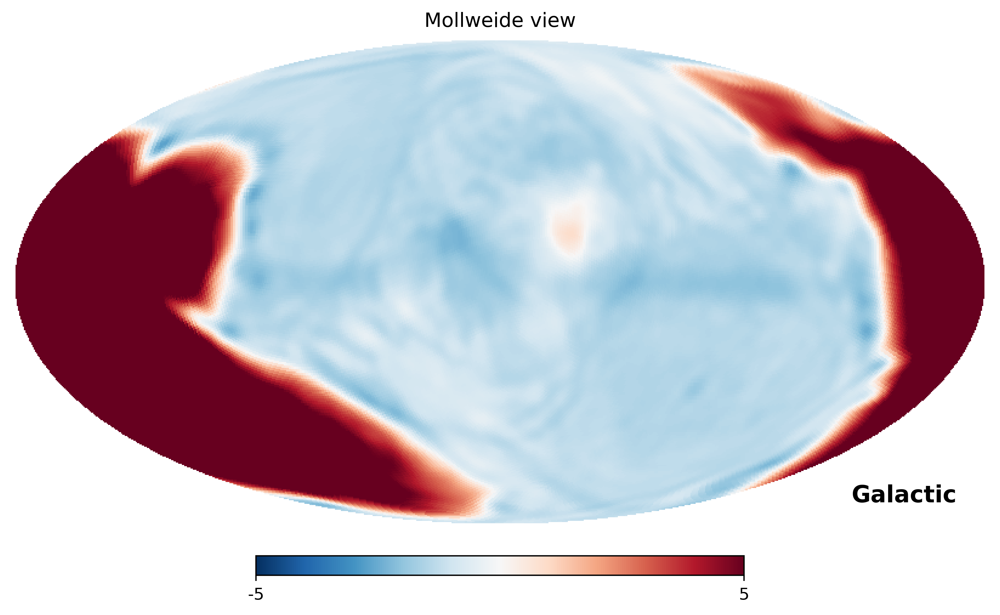

In [47]:
hp.mollview(xml[199],coord=['C','G'],min=-5,max=5,cmap='RdBu_r')

In [23]:
tbeg, tend = 1717.6256+(np.linspace(1666.4384902198801, 2704.3655735533684, 2) + 2455197.5 - 2457023.5 - 0.25)*4
t = np.linspace(tbeg,tend,Nt)
T = np.linspace(tbeg,tend,NT)

In [43]:
mag_idx = 143
bins = np.arange(1.7,23.05,0.1)
print(bins[mag_idx])


16.000000000000014


In [24]:
def f(x,a):
    if x < a:
        return (1.0+a-x)*np.exp(-a)
    else:
        return np.exp(-x)
    
mag_idx = 190
bins = np.arange(1.7,23.05,0.1)
print(bins[mag_idx])
a = 0.0
alpha = 0.5*np.log(2)
pmt = np.zeros(NT)
x1, x2 = xml[mag_idx,fov_1_hpx], xml[mag_idx,fov_2_hpx]
y1, y2 = np.exp(-x1), np.exp(-x2)
y1[x1 < a] = (1.0+a-x1[x1 < a])*np.exp(-a)
y2[x2 < a] = (1.0+a-x2[x2 < a])*np.exp(-a)
pmt = np.exp(-alpha*(y1+y2))
time_mapper = np.round(np.arange(NT)*Nt/NT)
time_mapper[time_mapper == 896769] -=1
time_mapper = time_mapper.astype(int)
pt = special.expit(xt)
Pt = pt[time_mapper]
P = Pt*pmt

20.700000000000017


(0.0, 1.0)

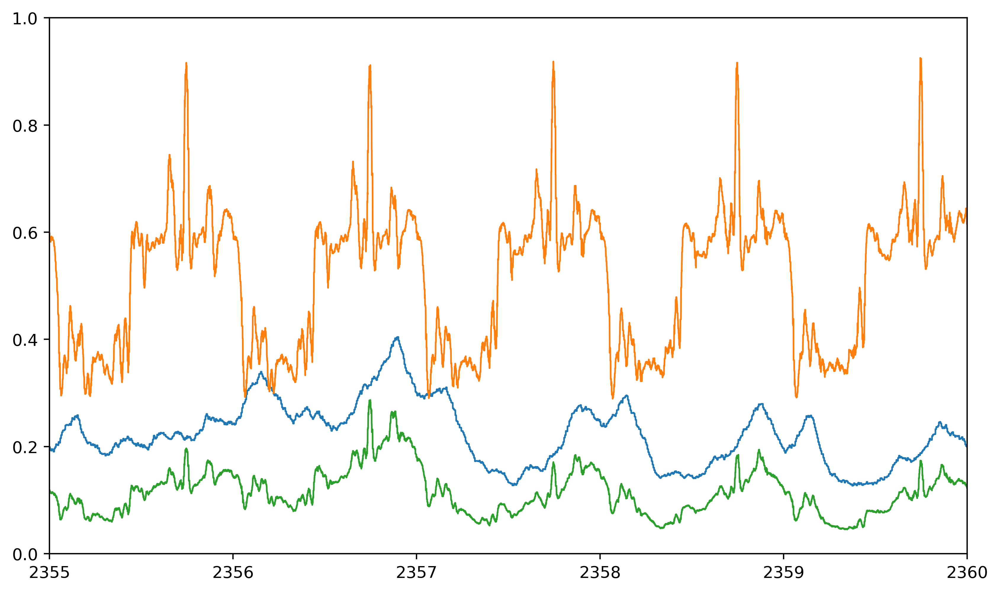

In [17]:
plt.figure(figsize=(10,6))
plt.plot(T,pt[time_mapper],lw=1)
plt.plot(T,pmt,lw=1)
plt.plot(T,pt[time_mapper]*pmt,lw=1)
plt.xlim([2355,2360])
#plt.xlim([1075,1175])
plt.ylim([0,1])

(0.0, 1.0)

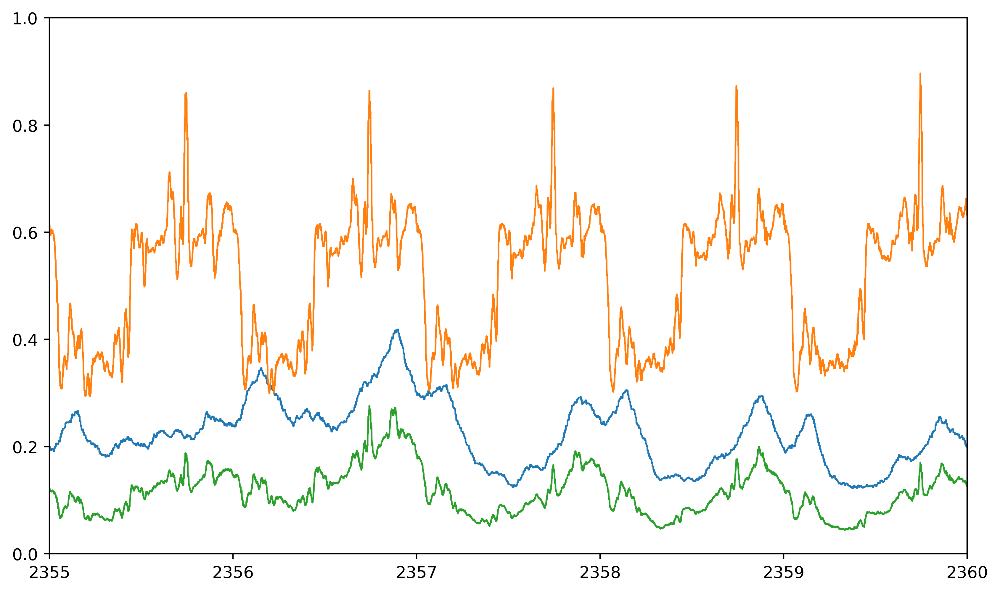

In [25]:
plt.figure(figsize=(10,6))
plt.plot(T,pt[time_mapper],lw=1)
plt.plot(T,pmt,lw=1)
plt.plot(T,pt[time_mapper]*pmt,lw=1)
plt.xlim([2355,2360])
#plt.xlim([1075,1175])
plt.ylim([0,1])

In [266]:
6*360/96

22.5

In [21]:
_data = pd.read_csv('../../global_data/CommandedScanLaw_001.csv')
_columns = ['jd_time', 'ra_fov1', 'dec_fov1', 'ra_fov2', 'dec_fov2']
_keys = ['tcb_at_gaia', 'ra_fov_1', 'dec_fov_1', 'ra_fov_2', 'dec_fov_2']
_box = {}
_order = np.argsort(_data['jd_time'].values)
for j,k in zip(_columns,_keys):
    _box[k] = _data[j].values[_order]
del _data
print('There are',_box['tcb_at_gaia'].size,'time points.')


There are 8967691 time points.


/Users/douglasboubert/anaconda3/envs/gaiaedr3/lib/python3.7/site-packages/healpy/projaxes.py:543: UserWarning: 0.0 180.0 -180.0 180.0
  pmin / dtor, pmax / dtor, mmin / dtor, mmax / dtor
/Users/douglasboubert/anaconda3/envs/gaiaedr3/lib/python3.7/site-packages/healpy/projaxes.py:658: UserWarning: The interval between parallels is 30 deg -0.00'.
  vdeg, varcmin
/Users/douglasboubert/anaconda3/envs/gaiaedr3/lib/python3.7/site-packages/healpy/projaxes.py:666: UserWarning: The interval between meridians is 30 deg -0.00'.
  vdeg, varcmin


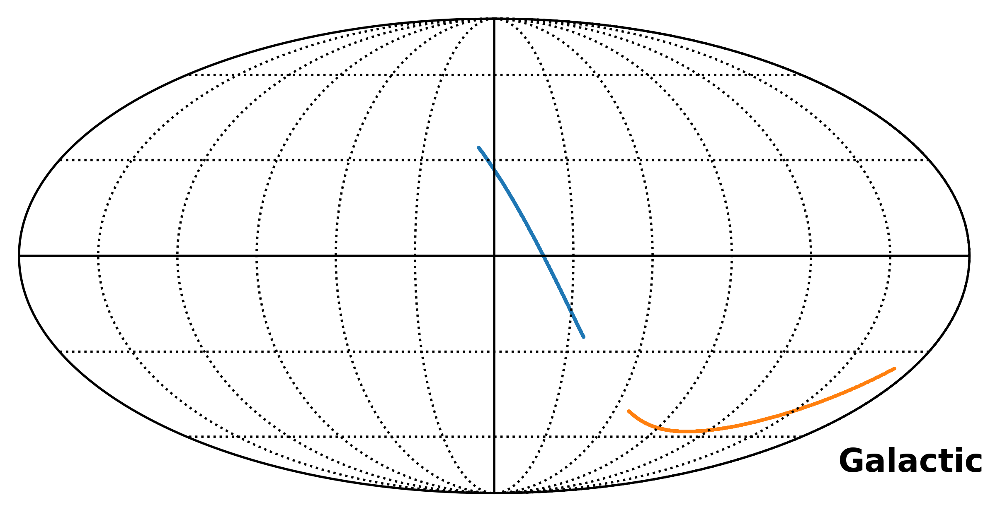

In [38]:
hp.graticule(coord=['G'])

in_window = np.where((T>1384.9)&(T<1385.1))
hp.projscatter(_box['ra_fov_1'][in_window],_box['dec_fov_1'][in_window],lonlat=True,coord=['C'],s=0.3,vmin=0,vmax=1);
hp.projscatter(_box['ra_fov_2'][in_window],_box['dec_fov_2'][in_window],lonlat=True,coord=['C'],s=0.3,vmin=0,vmax=1);

In [120]:
time_mapper

array([      0,      90,     180, ..., 8967420, 8967510, 8967600])

In [101]:
def f(x,a):
    if x < a:
        return (1.0+a-x)*np.exp(-a)
    else:
        return np.exp(-x)
np.exp(-np.log(2)*f(-7,-3))

5.864817947412869e-31

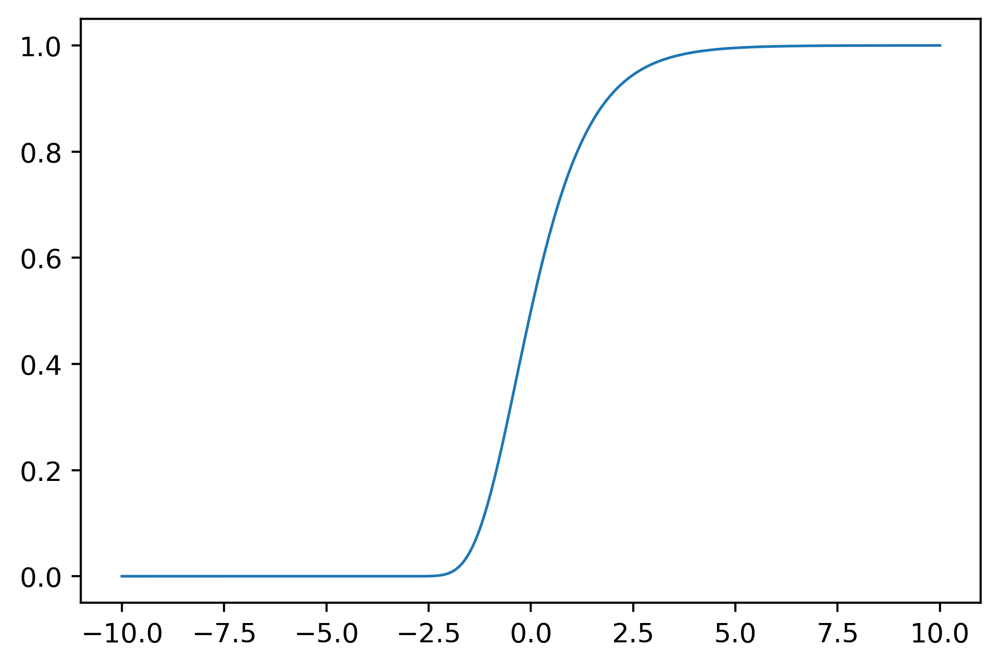

In [83]:
x = np.linspace(-10,10,10000)
def f(x):
    return np.exp(-x)
y = np.array([f(_x) for _x in x])


#y3 = np.array([f(_x,-4) for _x in x])
#plt.plot(x,np.exp(-np.log(2)*y2),lw=0.3)
#plt.plot(x,np.exp(-np.log(2)*y3),lw=0.3)
plt.plot(x,np.exp(-np.log(2)*y),lw=1)

In [86]:
np.exp(np.exp(-100))

1.0

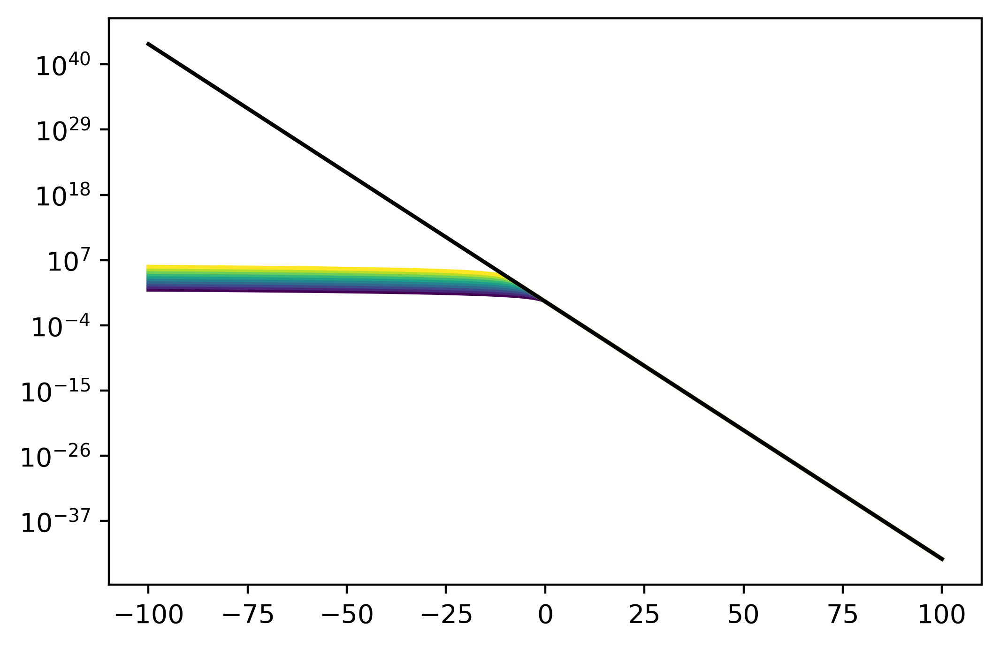

In [84]:

def f(x,a):
    if x < a:
        return (1.0+a-x)*np.exp(-a)
    else:
        return np.exp(-x)
x = np.linspace(-100,100,10000)
for a in range(10):
    y = np.array([f(_x,-a) for _x in x])
    plt.plot(x,y,label=-a,color=plt.cm.viridis(a/9))
y = np.array([f(_x,-1000) for _x in x])
plt.plot(x,y,color='k')
plt.yscale('log')
#plt.plot([-5,5],[5,5],ls='--')
#plt.savefig('./tmp.png',dpi=300,bbox_inches='tight',facecolor='w')

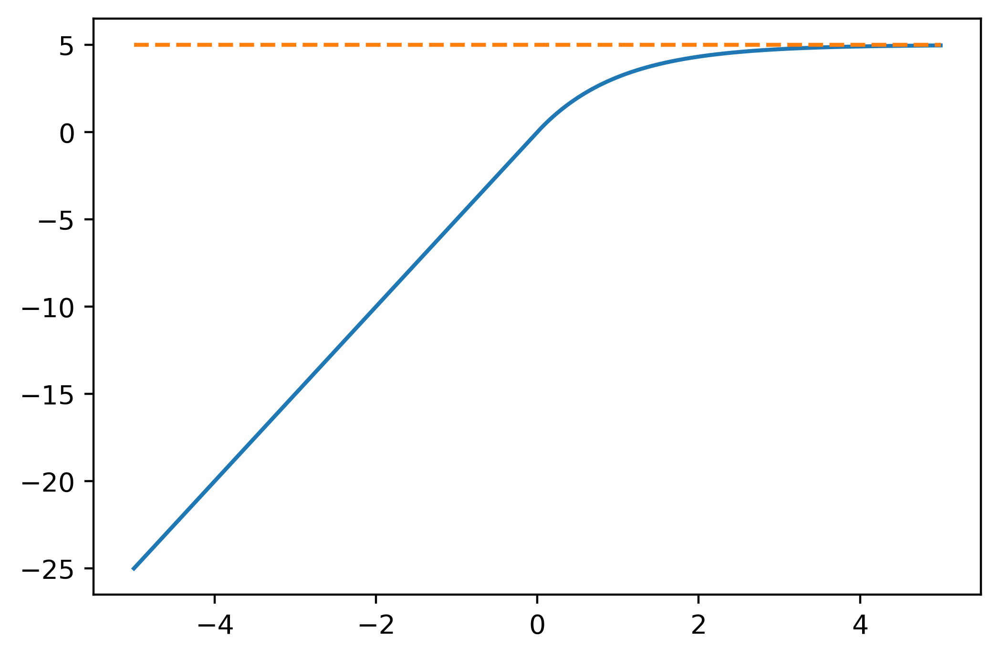

In [152]:
alpha = 5.0
def f(x):
    if x < 0:
        return alpha*x
    else:
        return alpha*(1-np.exp(-x))
x = np.linspace(-5,5,10000)
y = np.array([f(_x) for _x in x])
plt.plot(x,y)
plt.plot([-5,5],[5,5],ls='--')
plt.savefig('./tmp.png',dpi=300,bbox_inches='tight',facecolor='w')

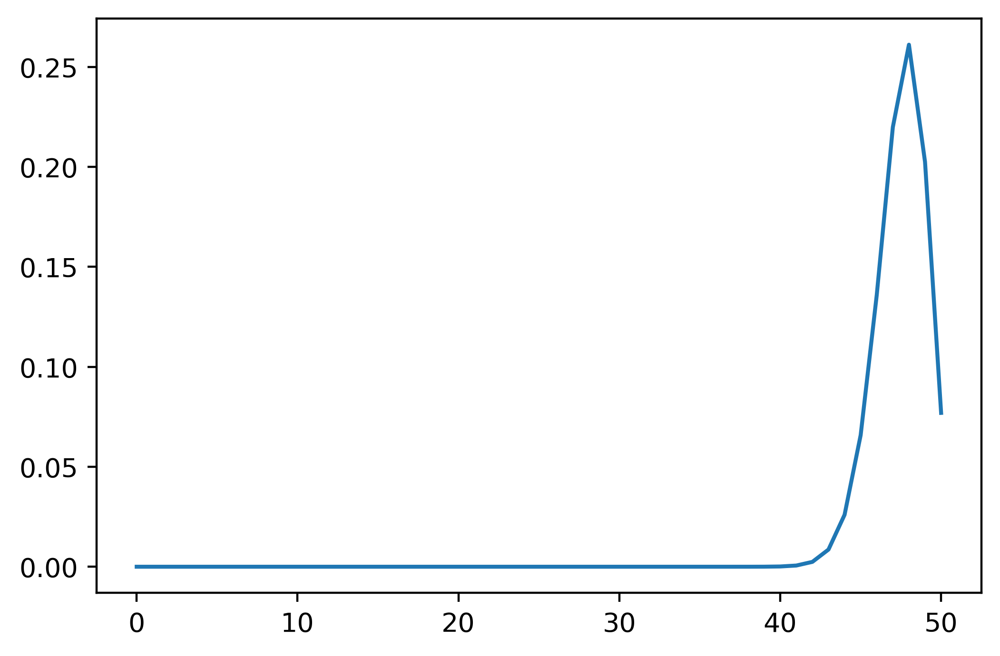

In [129]:
k = np.arange(51)
from scipy import stats
plt.plot(k,stats.binom(n=50,p=0.95).pmf(k))

In [134]:
stats.binom(n=50,p=0.95).sf(47)

0.5405331227195149

In [108]:
from astroquery.utils.tap.core import TapPlus   
gaia = TapPlus(url="https://gea.esac.esa.int/tap-server/tap")
query = f'''SELECT healpix_index AS healpix, gmag_index / 10 AS gmag, count(*) AS frequency FROM (
SELECT gaia_healpix_index(7, source_id) AS healpix_index,
    floor(phot_g_mean_mag * 10) AS gmag_index
FROM gaiaedr3.gaia_source
where phot_g_mean_mag > 21.5
) AS subquery
GROUP BY healpix_index, gmag_index'''
job = gaia.launch_job_async(query)
table = job.get_results()


Created TAP+ (v1.2.1) - Connection:
	Host: gea.esac.esa.int
	Use HTTPS: True
	Port: 443
	SSL Port: 443
INFO: Query finished. [astroquery.utils.tap.core]


In [109]:
count = np.histogram2d(table['healpix'],table['gmag'],bins=(np.arange(-0.5,hp.nside2npix(128)),np.arange(21.45,23.0,0.1)),weights=table['frequency'])[0]

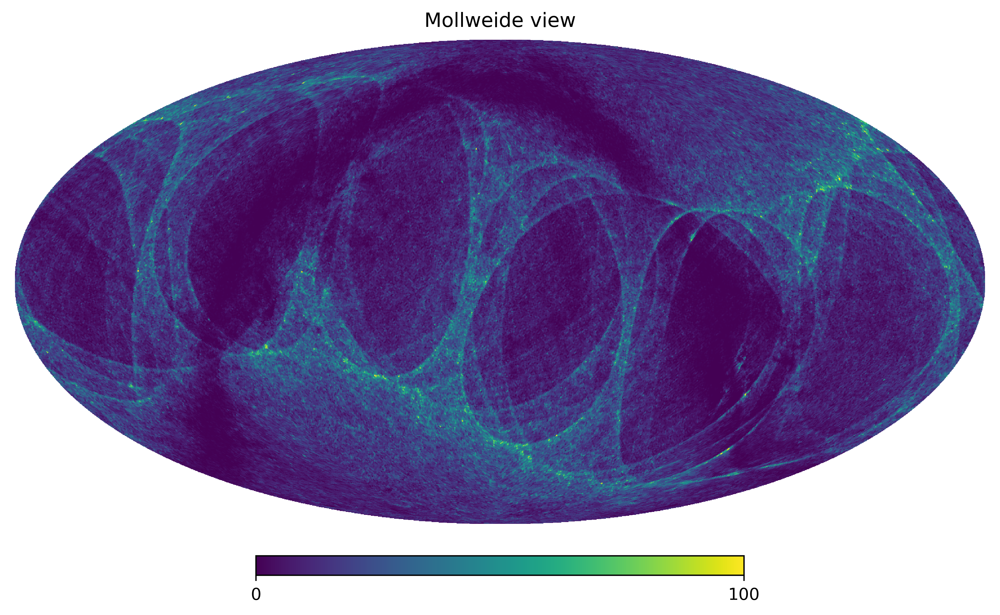

In [111]:
hp.mollview(count[:,:].sum(axis=1),nest=True,max=100,xsize=2000)
plt.savefig('./tmp.png',dpi=300,bbox_inches='tight',facecolor='w')

In [96]:
from astroquery.utils.tap.core import TapPlus   
gaia = TapPlus(url="https://gea.esac.esa.int/tap-server/tap")
query = f'''SELECT phot_g_mean_mag, astrometric_matched_transits FROM gaiaedr3.gaia_source where phot_g_mean_mag > 21.5;'''
job = gaia.launch_job_async(query)
table = job.get_results()


Created TAP+ (v1.2.1) - Connection:
	Host: gea.esac.esa.int
	Use HTTPS: True
	Port: 443
	SSL Port: 443
INFO: Query finished. [astroquery.utils.tap.core]


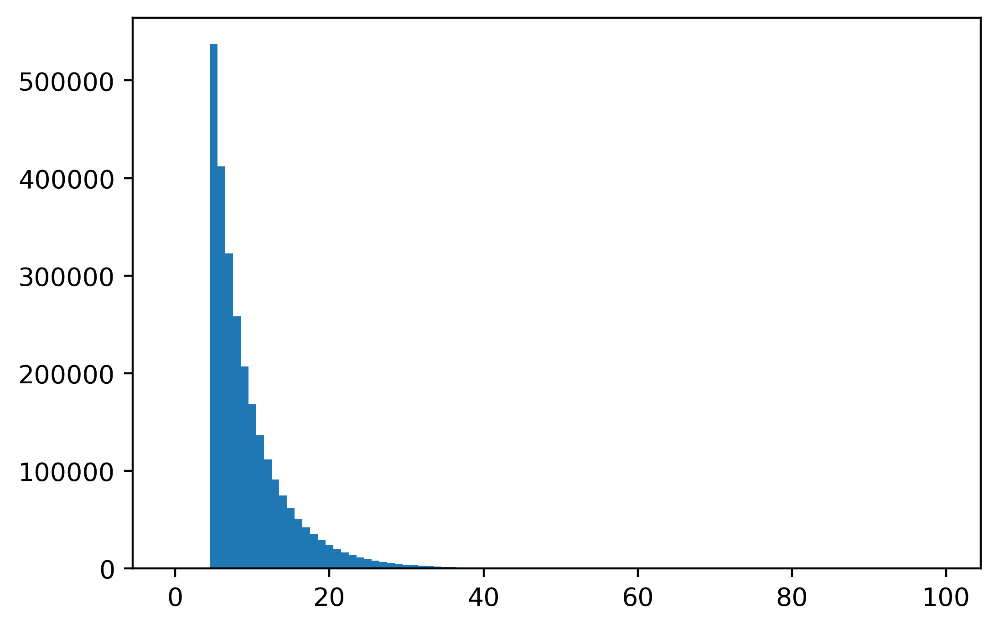

In [101]:
plt.hist(table['astrometric_matched_transits'],np.arange(-0.5,100));

In [113]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy import special
import healpy as hp

# Load in parameters
#directory = '/mnt/extraspace/GaiaSelectionFunction/Code/C++/Test/SlimTest/'
directory = '/Users/douglasboubert/Science/gaia-selection-function/Gaia-EDR3-selection-function/Python/data/DataSubsetRun/'
params = pd.read_csv(directory+'Optimiser_Properties.dat',skipinitialspace=True)
Nt = int(params['Nt'][0])
Nm = int(params['Nm'][0])
Nl = int(params['Nl'][0])
Ns = int(params['Ns'][0])

# Load in gaps
gaps = pd.read_csv('/Users/douglasboubert/Science/gaia-selection-function/Gaia-EDR3-selection-function/Python/data/edr3_gaps.csv')

# Load in transformed parameters
file = 'TempPositions/TempPosition_TransformedParameters.dat'
#file = 'FinalPosition_TransformedParameters.dat'
xt = pd.read_csv(directory+file,header=None)[0][:Nt].values
xml = np.reshape(pd.read_csv(directory+file,header=None)[0][Nt:].values,(Nl,Nm)).T

In [114]:
# Load in transformed parameters
file = 'TempPositions/TempPosition_InternalParameters.dat'
#file = 'FinalPosition_TransformedParameters.dat'
xt = pd.read_csv(directory+file,header=None)[0][:Nt].values
xms = np.reshape(pd.read_csv(directory+file,header=None)[0][Nt:].values,(Ns,Nm)).T

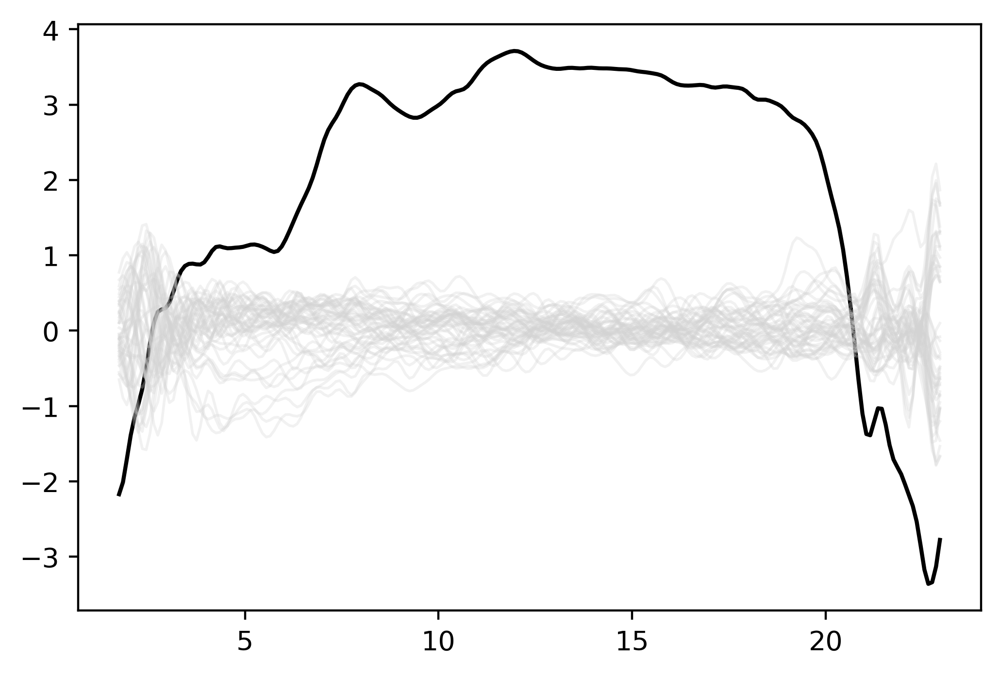

In [127]:
g_bins = np.arange(1.7,23.05,0.1)
p_bins = np.linspace(0,1,101)
g = 0.5*(g_bins[1:]+g_bins[:-1])

N = 213
x = np.arange(N)
l = 3.0
d = np.abs(x[:,np.newaxis]-x[np.newaxis,:])
K = np.exp(-0.5*np.square(d/l))
L = np.linalg.cholesky(K)

plt.plot(g, np.dot(L,2*xms[:,0]),c='k')
#for i in range(0,12):
#    plt.plot(g,np.dot(L,2*xms[:,1+i]),c='grey',lw=1,alpha=0.3)
    
for i in range(0,48):
    plt.plot(g,np.dot(L,2*xms[:,1+12+i]),c='lightgrey',lw=1,alpha=0.3)

In [128]:
Nl

49152

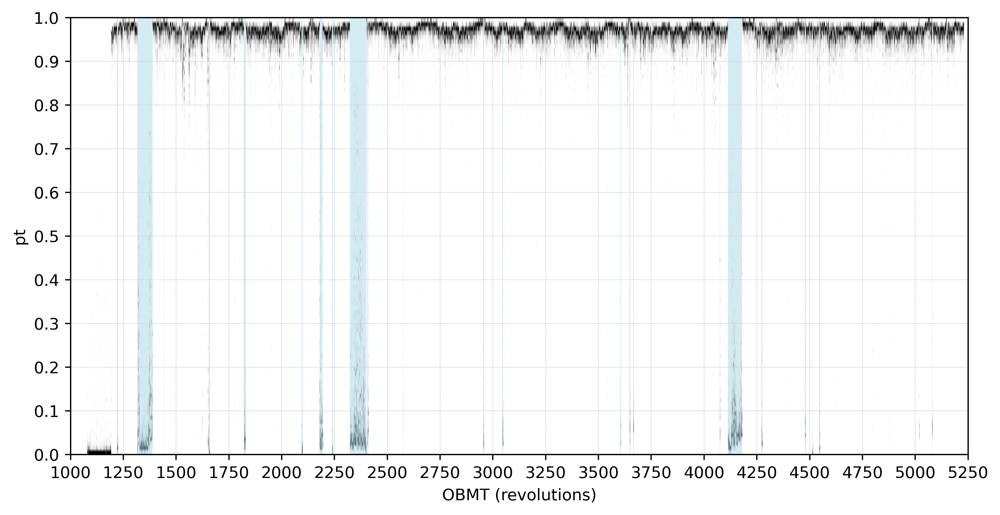

In [53]:
# Plot - pt
plt.figure(figsize=(10,5))
tbeg, tend = 1717.6256+(np.linspace(1666.4384902198801, 2704.3655735533684, 2) + 2455197.5 - 2457023.5 - 0.25)*4
t = np.linspace(tbeg,tend,Nt+1)
t = 0.5*(t[1:]+t[:-1])
t_bins = np.linspace(tbeg,tend,2693+1)
p_bins = np.linspace(0,1,101)
count = np.histogram2d(t,special.expit(xt),bins=(t_bins,p_bins))[0]
from scipy.ndimage import gaussian_filter
count = gaussian_filter(count,sigma=[0,0])
count /= count.max(axis=1)[:,np.newaxis]
plt.imshow(count.T,extent=([tbeg,tend,0,1]),origin='lower',aspect='auto',cmap='Greys',alpha=1.0)
#plt.hist(0.5*(bins[1:]+bins[:-1]),bins = bins,weights=special.expit(xt),lw=0.01,color='k',histtype='step')
#plt.plot(0.5*(bins[1:]+bins[:-1]),special.expit(xt),lw=0,marker='o',ms=0.3,mew=0,color='k')
for start,end in zip(gaps['tbeg'].values,gaps['tend'].values):
    plt.fill_between([start,end],y1=[0,0],y2=[1,1],color='lightblue',lw=0.0,alpha=0.5)
plt.ylim([0,1])
plt.xlabel('OBMT (revolutions)')
plt.ylabel('pt')
plt.xticks(np.arange(1000,5251,250))
plt.yticks(np.arange(0.0,1.01,0.1))
plt.grid(axis='both',which='both',lw=0.3,color='lightgrey',zorder=0)

In [58]:
xml.shape

(213, 49152)

In [60]:
np.repeat(g[:,np.newaxis],xml.shape[1],axis=1)

(213,)

Text(0, 0.5, 'pm')

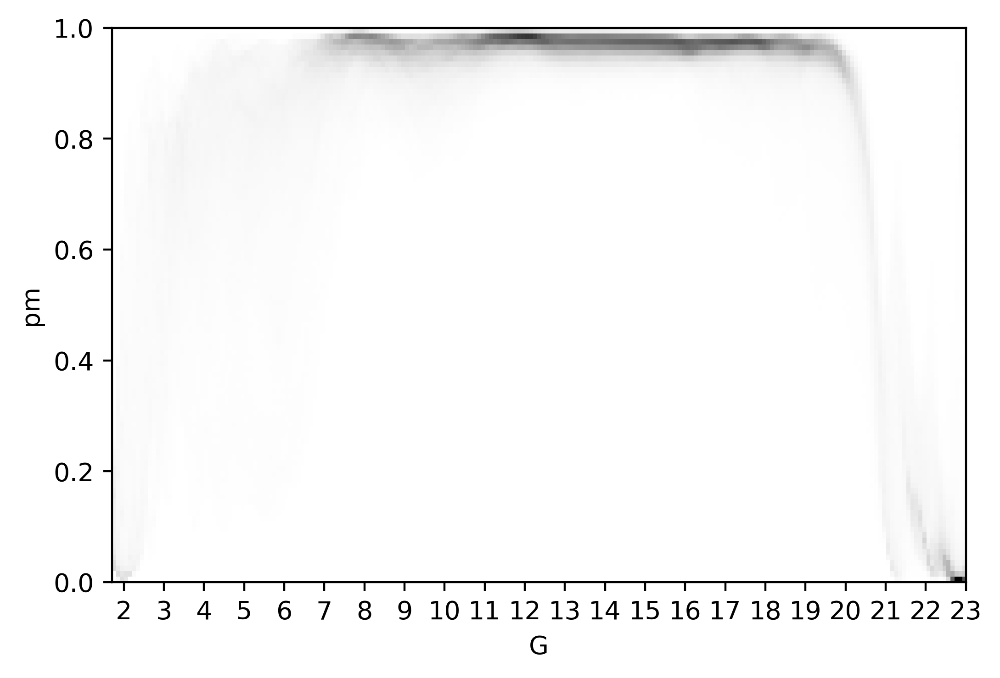

In [103]:
g_bins = np.arange(1.7,23.05,0.1)
p_bins = np.linspace(0,1,101)
g = 0.5*(g_bins[1:]+g_bins[:-1])
count = np.histogram2d(np.repeat(g[:,np.newaxis],xml.shape[1],axis=1).flatten(),special.expit(2.0*xml).flatten(),bins=(g_bins,p_bins))[0]
#count /= count.max(axis=1)[:,np.newaxis]
plt.imshow(count.T,extent=([1.7,23.0,0,1]),origin='lower',aspect='auto',cmap='Greys',alpha=1.0)
plt.ylim([0,1])
plt.xticks(np.arange(2,23.1))
plt.xlabel('G')
plt.ylabel('pm')

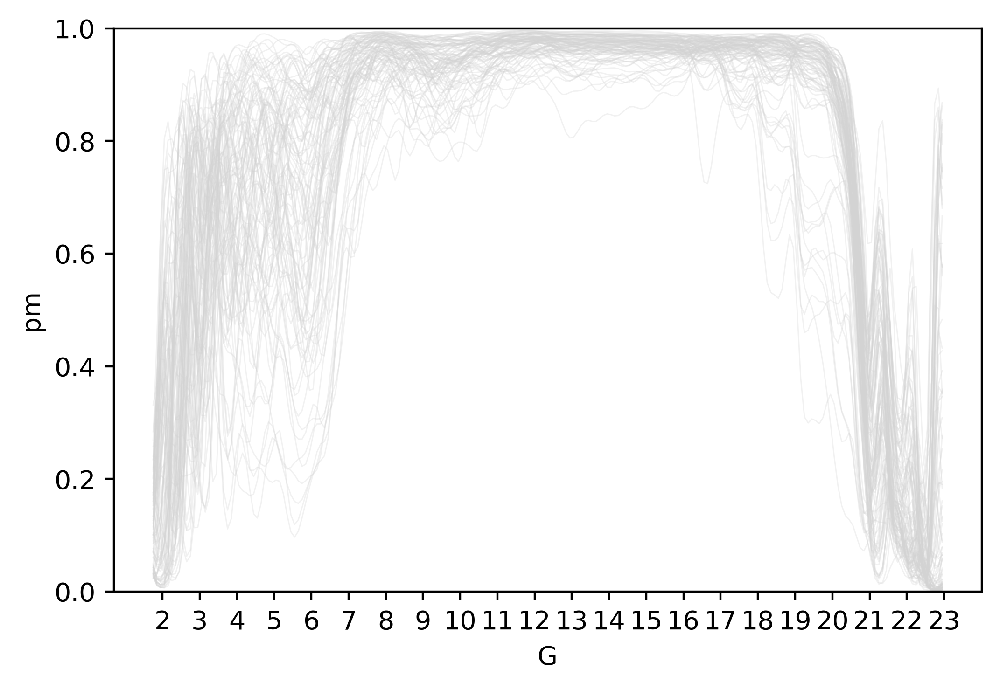

In [106]:
# Plot - pm
for l in np.random.choice(range(Nl),100):
    plt.plot(g,special.expit(2*xml[:,l]),color='lightgrey',alpha=0.3,lw=0.5);
plt.ylim([0,1])
plt.xlabel('G')
plt.ylabel('pm')
plt.xticks(np.arange(2,23.1));

In [122]:
N = 214
x = np.arange(N)
l = 3.0
d = np.abs(x[:,np.newaxis]-x[np.newaxis,:])
K = np.exp(-0.5*np.square(d/l))
L = np.linalg.cholesky(K)

from scipy import sparse
csr_matrix = sparse.csr_matrix(L)
true_w, true_v, true_u = csr_matrix.data, csr_matrix.indices, csr_matrix.indptr
true_u = np.concatenate([np.repeat(i,true_u[i+1]-true_u[i]) for i in range(true_u.size-1)])

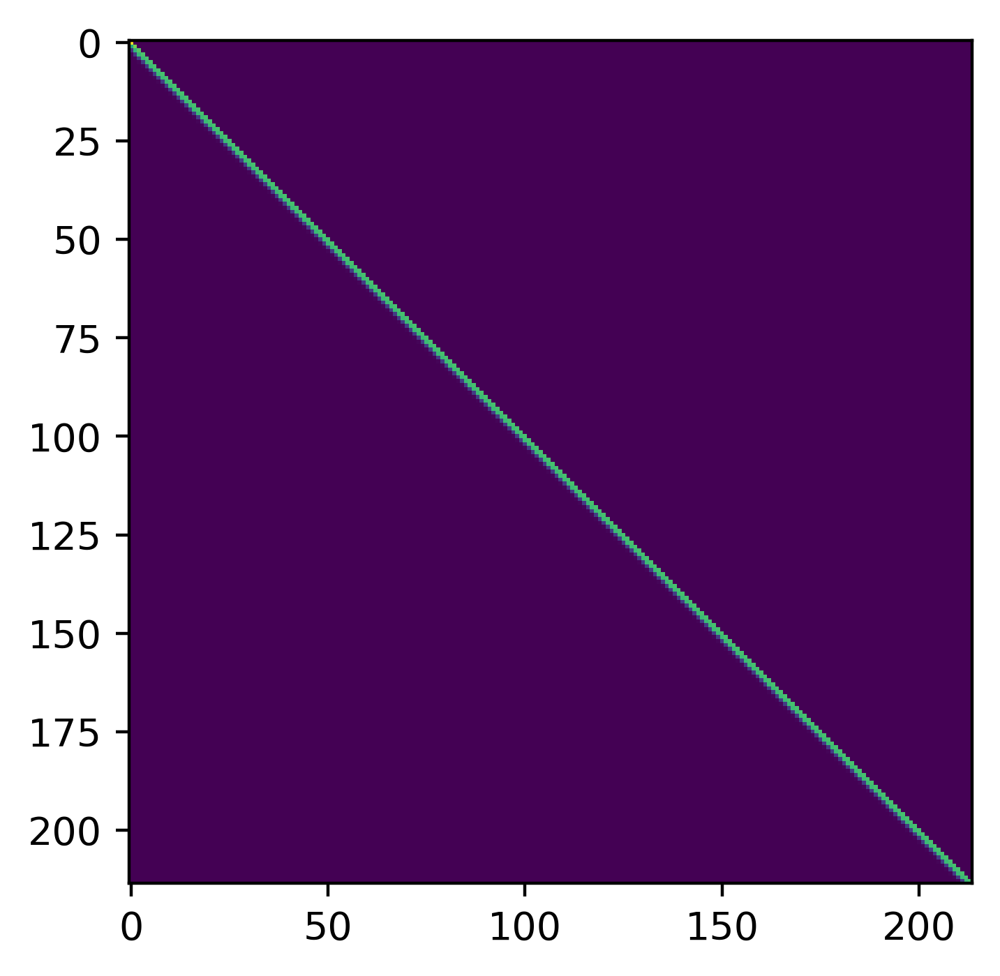

In [56]:
plt.imshow(L)

In [250]:
N = 214
x = np.arange(N)
l = 3.0
d = np.abs(x[:,np.newaxis]-x[np.newaxis,:])
K = np.exp(-0.5*np.square(d/l))
L = np.linalg.cholesky(K)
cholesky_tol = 1e-2

u,v,w = [],[],[]
max_element = np.zeros(N)
for m in range(N):
    for n in range(N):
        max_element[m] += max(0,abs(L[m,n])-max_element[m])

for m in range(N):
    for n in range(N):
        if abs(L[m,n]) > cholesky_tol*max_element[m]:
            u.append(m)
            v.append(n)
            w.append(L[m,n])
            
#assert np.all(np.isclose(u,true_u))
#assert np.all(np.isclose(v,true_v))
#assert np.all(np.isclose(w,true_w))

In [249]:
len(u)/L.size

0.018560572975805746

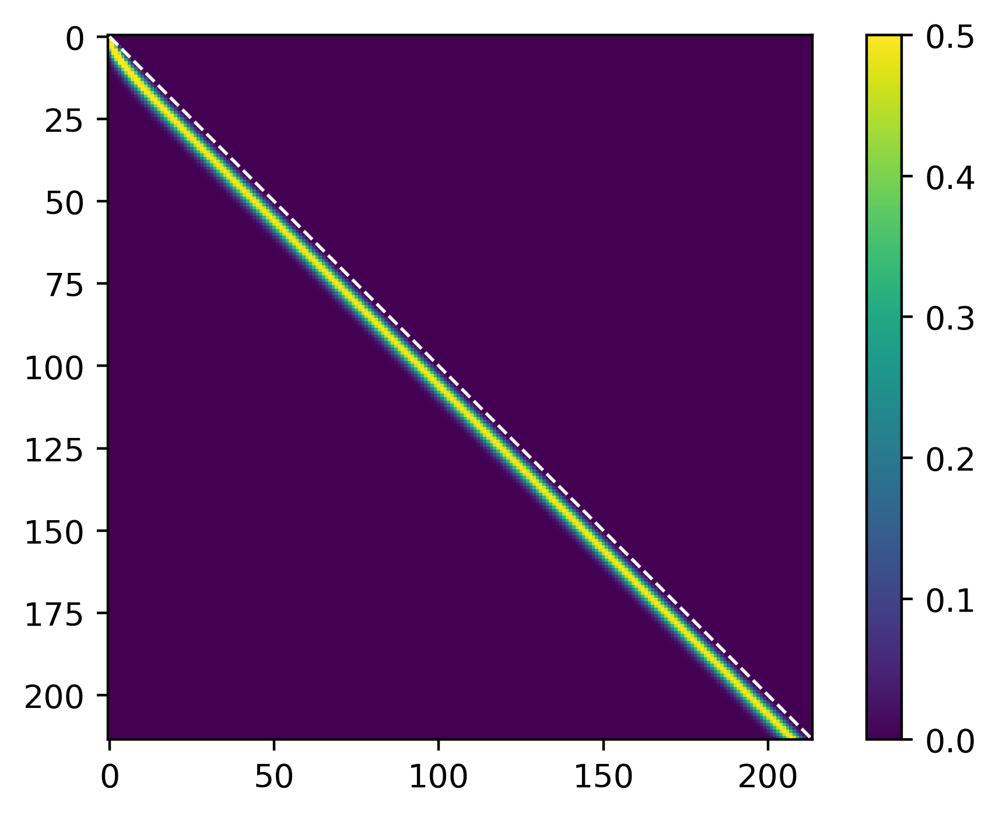

In [206]:
plt.imshow(L,vmax=0.5)
plt.colorbar()
plt.plot([0,213],[0,213],zorder=10,c='w',lw=1,ls='--')

In [168]:
def _pivoted_cholesky(A, M, err_tol = 1e-6):
        """
        https://dl.acm.org/doi/10.1016/j.apnum.2011.10.001 implemented by https://github.com/NathanWycoff/PivotedCholesky
        A simple python function which computes the Pivoted Cholesky decomposition/approximation of positive semi-definite operator. Only diagonal elements and select rows of that operator's matrix represenation are required.
        get_diag - A function which takes no arguments and returns the diagonal of the matrix when called.
        get_row - A function which takes 1 integer argument and returns the desired row (zero indexed).
        M - The maximum rank of the approximate decomposition; an integer.
        err_tol - The maximum error tolerance, that is difference between the approximate decomposition and true matrix, allowed. Note that this is in the Trace norm, not the spectral or frobenius norm.
        Returns: R, an upper triangular matrix of column dimension equal to the target matrix. It's row dimension will be at most M, but may be less if the termination condition was acceptably low error rather than max iters reached.
        """

        get_diag = lambda: np.diag(A).copy()
        get_row = lambda i: A[i,:]

        d = np.copy(get_diag())
        N = len(d)

        pi = list(range(N))

        R = np.zeros([M,N])

        err = np.sum(np.abs(d))

        m = 0
        while (m < M) and (err > err_tol):

            i = m + np.argmax([d[pi[j]] for j in range(m,N)])

            tmp = pi[m]
            pi[m] = pi[i]
            pi[i] = tmp

            R[m,pi[m]] = np.sqrt(d[pi[m]])
            Apim = get_row(pi[m])
            for i in range(m+1, N):
                if m > 0:
                    ip = np.inner(R[:m,pi[m]], R[:m,pi[i]])
                else:
                    ip = 0
                R[m,pi[i]] = (Apim[pi[i]] - ip) / R[m,pi[m]]
                d[pi[i]] -= pow(R[m,pi[i]],2)

            err = np.sum([d[pi[i]] for i in range(m+1,N)])
            m += 1

        R = R[:m,:]

        return(R.T)

In [170]:
R = _pivoted_cholesky(K,214,err_tol=1e-2)
print(R.shape)

(214, 100)


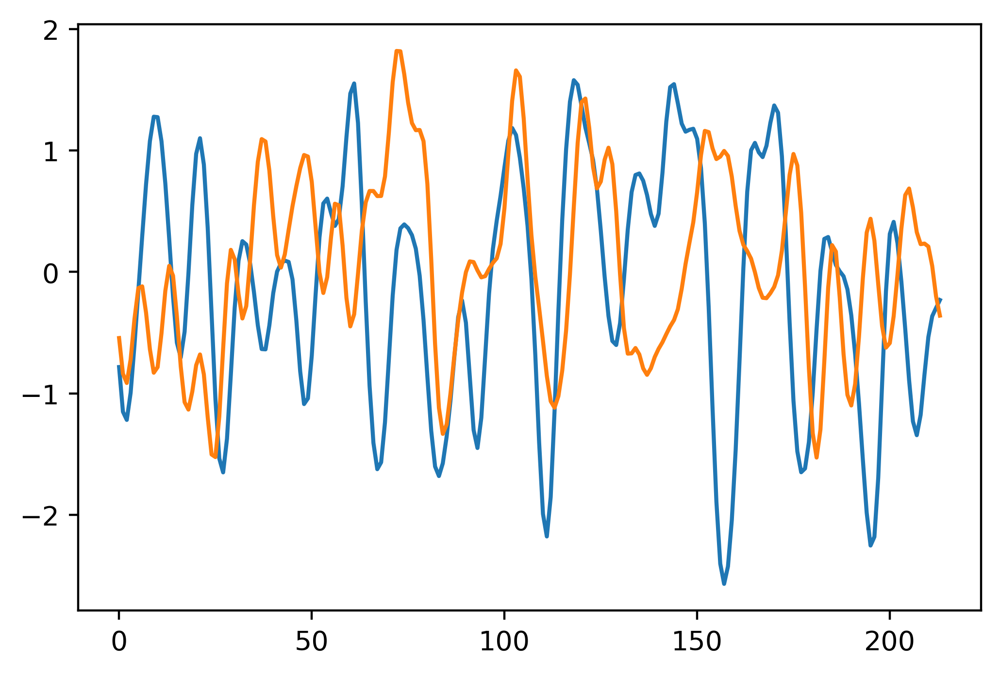

In [177]:
x = np.random.normal(0,1,100)
plt.plot(np.dot(R,x))
x = np.random.normal(0,1,214)
plt.plot(np.dot(L,x))

In [187]:
np.where(np.abs(L)>1e-2)[0].size/L.size

0.05413136518473229

In [194]:
np.where(L/L.max(axis=1,keepdims=True)>1e-2)[0].size/L.size

0.058236527207616386

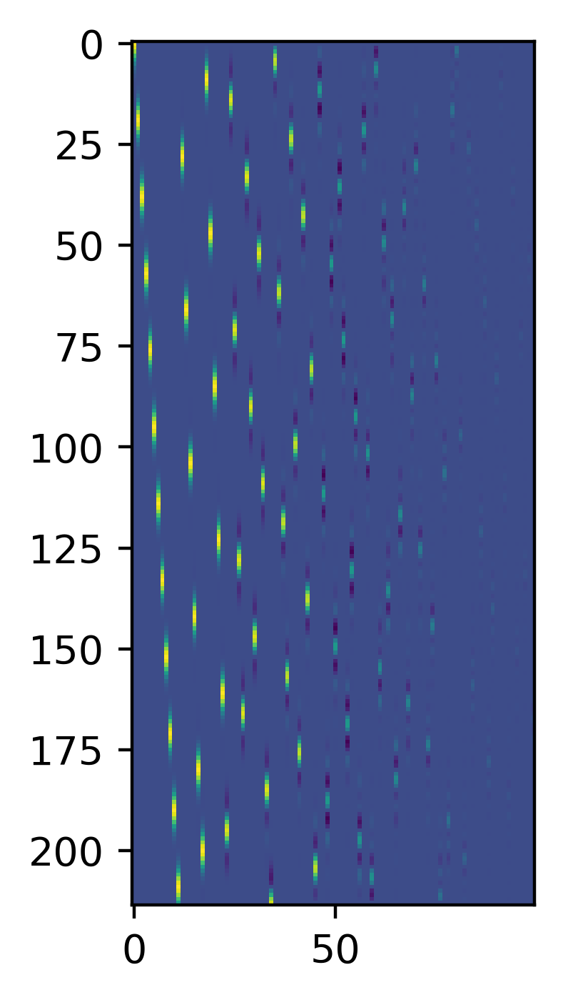

In [178]:
plt.imshow(R)

In [127]:
inv_K[0,0],inv_K[0,1],inv_K[1,2],inv_K[2,3],inv_K[3,4],inv_K[0,5]

(1.4618011754114448,
 -1.151757677827428,
 -1.1421453058692244,
 -1.1420604533485486,
 -1.1420015162639197,
 -0.007063595736010114)

In [102]:
x = np.arange(200)
l = 3.0
d = np.abs(x[:,np.newaxis]-x[np.newaxis,:])
K_se = np.exp(-np.square(d)/(2.0*l*l))
K_me = np.exp(-np.sqrt(3)*d/l)*(1.0+d*np.sqrt(3)/l)
L_se = np.linalg.cholesky(K_se)
L_me = np.linalg.cholesky(K_me)

/Users/douglasboubert/anaconda3/envs/gaiaedr3/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: divide by zero encountered in log10
  """Entry point for launching an IPython kernel.


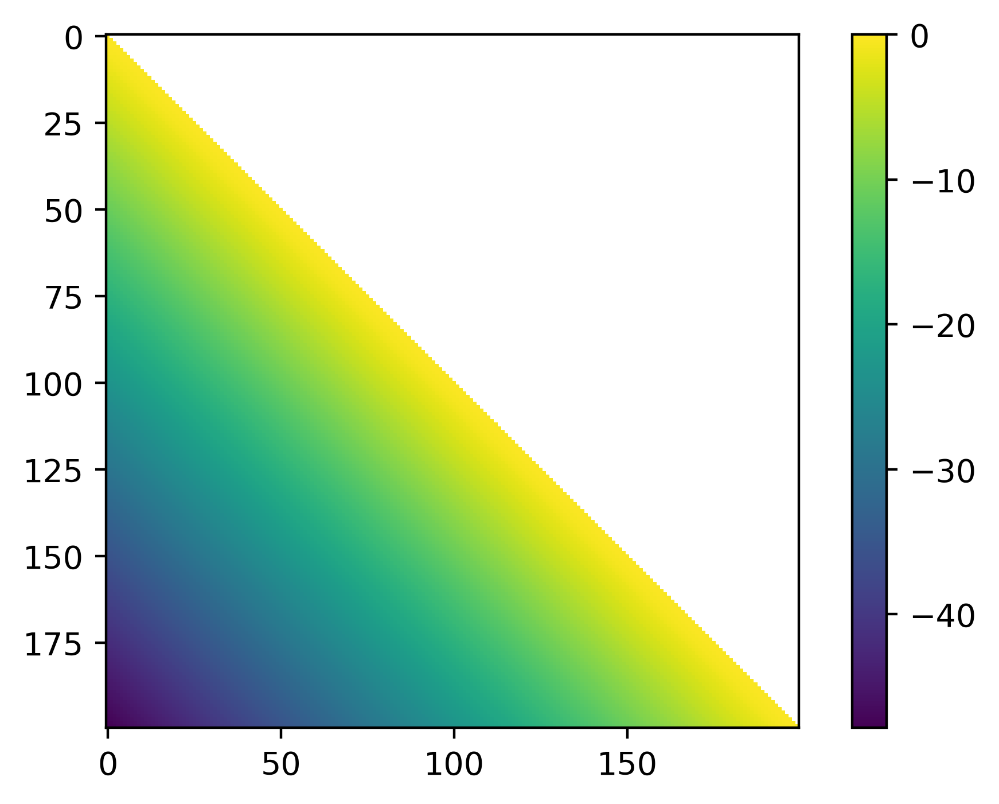

In [108]:
plt.imshow(np.log10(L_me),cmap='viridis')
plt.colorbar()
#plt.savefig('./tmp.png',facecolor='w',dpi=300,bbox_inches='tight')

In [72]:
L[0,7]

-0.0037229963599138606

In [75]:
# Load in parameters
#directory = '/mnt/extraspace/GaiaSelectionFunction/Code/C++/Test/SlimTest/'
directory = '/Users/douglasboubert/Science/gaia-selection-function/Gaia-EDR3-selection-function/Python/data/RegeneratedData/'
params = pd.read_csv(directory+'Optimiser_Properties.dat',skipinitialspace=True)
Nt = int(params['Nt'][0])
Nm = int(params['Nm'][0])
Nl = int(params['Nl'][0])

# Load in gaps
gaps = pd.read_csv('/Users/douglasboubert/Science/gaia-selection-function/Gaia-EDR3-selection-function/Python/data/edr3_gaps.csv')

# Load in transformed parameters
file = 'TempPositions/TempPosition_TransformedParameters.dat'
#file = 'FinalPosition_TransformedParameters.dat'
xt = pd.read_csv(directory+file,header=None)[0][:Nt].values
xml = np.reshape(pd.read_csv(directory+file,header=None)[0][Nt:].values,(Nl,Nm)).T

In [76]:
xml

array([[-0.673649, -0.673649, -0.673649, ..., -0.673649, -0.673649,
        -0.673649],
       [-0.687977, -0.687977, -0.687977, ..., -0.687977, -0.687977,
        -0.687977],
       [-0.648562, -0.648562, -0.648562, ..., -0.648562, -0.648562,
        -0.648562],
       ...,
       [-1.31877 , -1.31877 , -1.31877 , ..., -1.31877 , -1.31877 ,
        -1.31877 ],
       [-1.35917 , -1.35917 , -1.35917 , ..., -1.35917 , -1.35917 ,
        -1.35917 ],
       [-1.36791 , -1.36791 , -1.36791 , ..., -1.36791 , -1.36791 ,
        -1.36791 ]])

In [64]:
import pandas as pd
needlets = pd.read_csv('./data/needlets_2_1.csv')

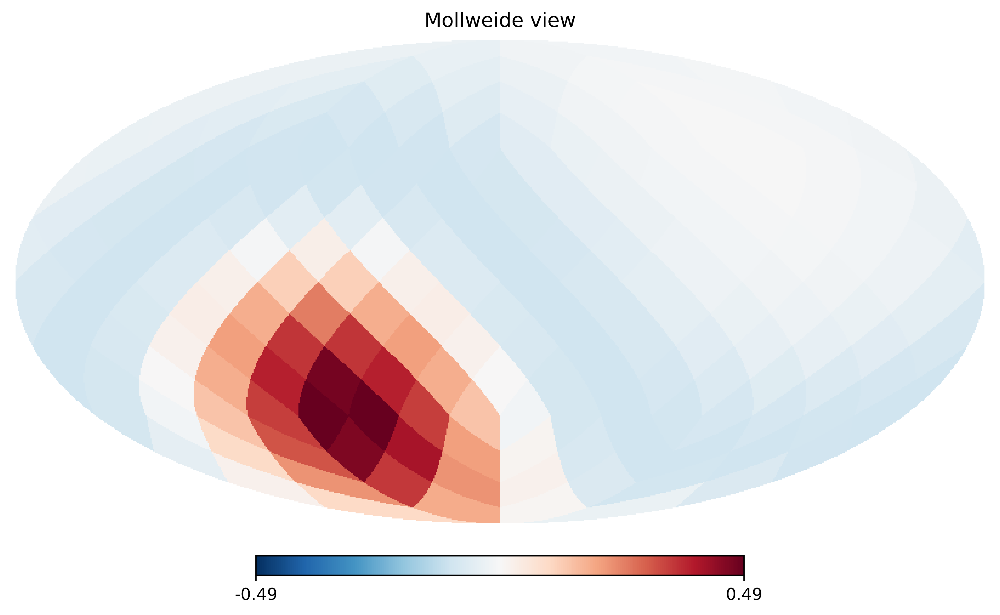

In [78]:
z = np.zeros(61)
z[50] = 1.0
x = np.zeros(192)
for u,v,w in zip(needlets['u'],needlets['v'],needlets['w']):
    x[u] += z[v]*w
top = np.max(np.abs(x))
hp.mollview(x,nest=False,min=-top,max=top,cmap='RdBu_r')

In [62]:
np.max(np.diff(_box['tcb_at_gaia'])),np.min(np.diff(_box['tcb_at_gaia']))

(0.00011574104496503423, 0.0001157405777121312)

In [41]:
np.arange(1.7,23.05,0.1).shape

(214,)

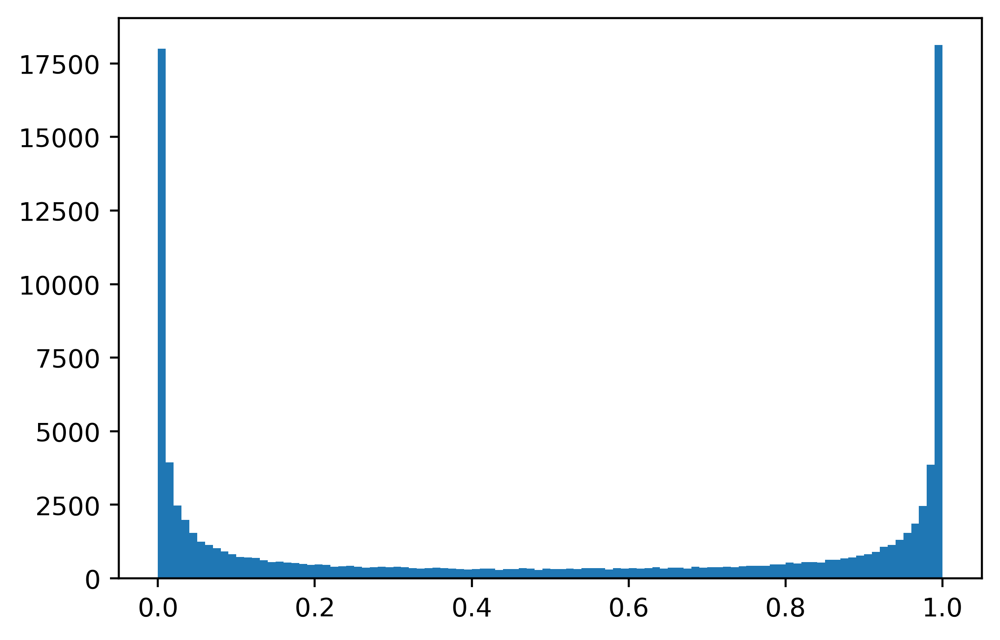

In [53]:
x = np.random.normal(0,5,100000)
plt.hist(special.expit(x),100);

In [27]:
x = +30
print(np.log(special.expit(x)))


-9.348077867344255e-14


In [76]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy import special
import healpy as hp

# Load in parameters
#directory = '/mnt/extraspace/GaiaSelectionFunction/Code/C++/Test/magnitudes/'
directory = '/Users/douglasboubert/Science/gaia-selection-function/Gaia-EDR3-selection-function/Python/data/magnitudes_sky/'
params = pd.read_csv(directory+'Optimiser_Properties.dat',skipinitialspace=True)
Nt = params['Nt'][0]
Nm = params['Nm'][0]
Nl = params['Nl'][0]

# Load in transformed parameters
file = 'TempPositions/TempPosition_TransformedParameters.dat'
#file = 'FinalPosition_TransformedParameters.dat'
xt = pd.read_csv(directory+file,header=None)[0][:Nt].values
xml = np.reshape(pd.read_csv(directory+file,header=None)[0][Nt:].values,(Nl,Nm)).T


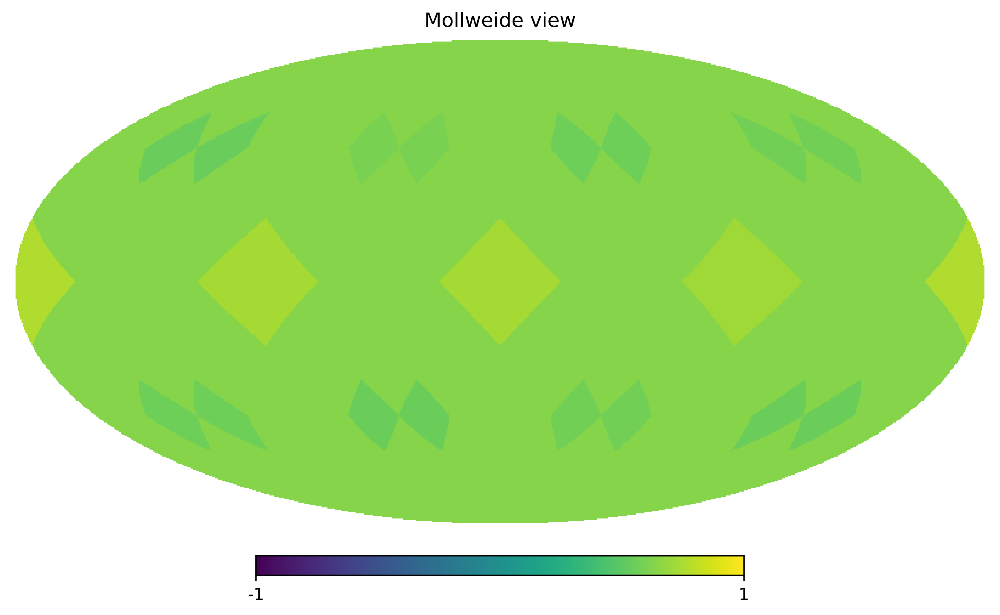

In [78]:
hp.mollview(xml[8],min=-1,max=1)

In [79]:
Nm = 10
healpix_order = 2
Nl = hp.nside2npix(hp.order2nside(healpix_order))
xml = np.repeat(np.linspace(-1.0,1.0,Nm)[:,np.newaxis],Nl,axis=1)

healpix_nside = hp.order2nside(healpix_order)
healpix_npix = hp.nside2npix(healpix_nside)
l, b = hp.pix2ang(nside=healpix_nside,ipix=np.arange(healpix_npix),lonlat=True,nest=False)
for m in range(Nm):
    xml[m] *= np.cos(np.deg2rad(b))

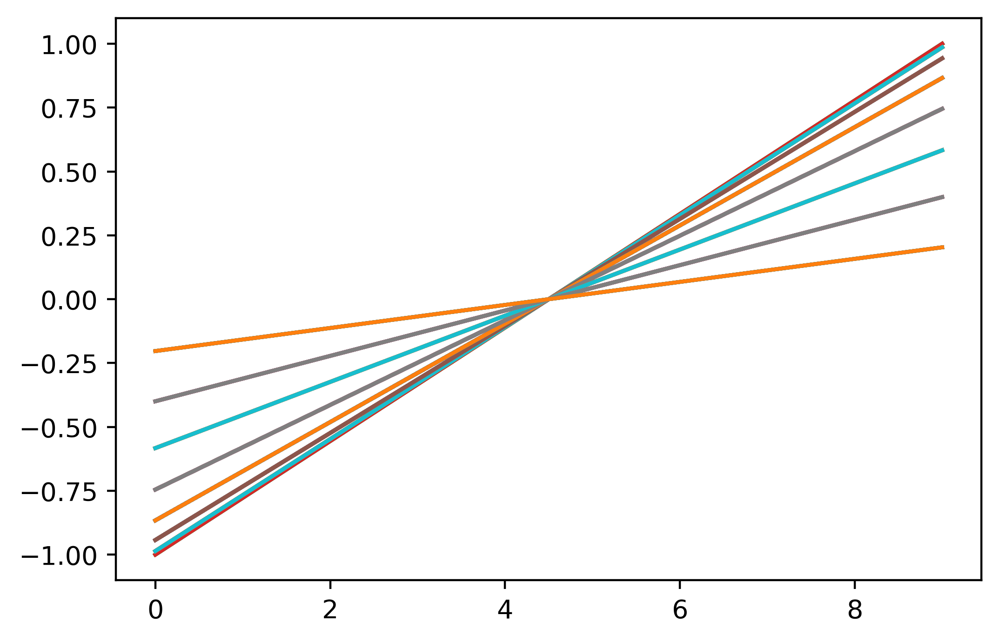

In [81]:
for l in range(healpix_npix):
    plt.plot(xml[:,l])

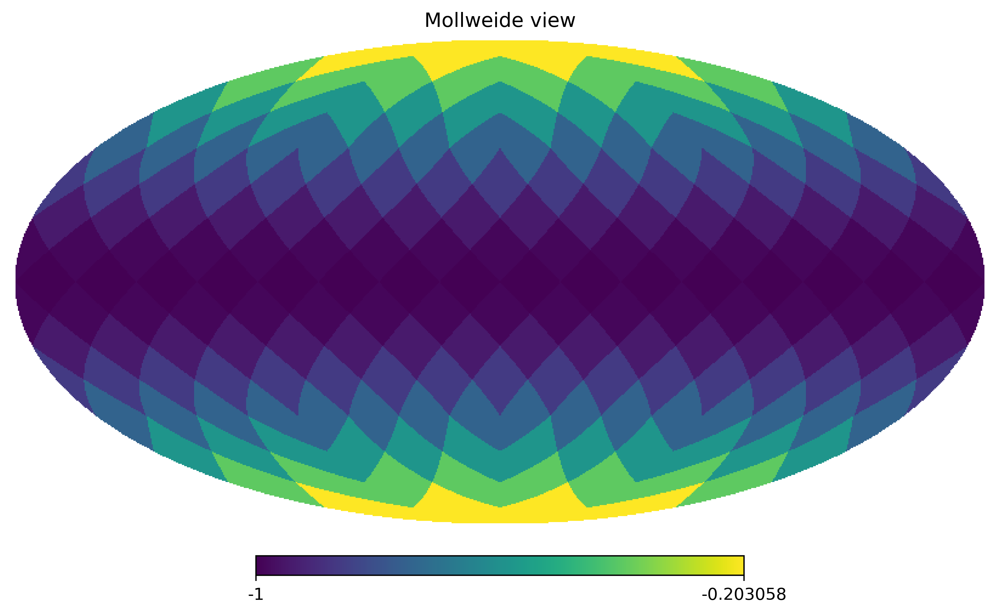

In [80]:
hp.mollview(xml[0])

In [8]:
hp.order2nside(np.arange(10))

array([  1,   2,   4,   8,  16,  32,  64, 128, 256, 512])

In [ ]:
12*

In [9]:
np.all([hp.nside2order(hp.npix2nside(12 * 4** order)) == order for order in range(12)])

True

In [4]:
hp.nside2npix(hp.order2nside(31))

ValueError: 2147483648 is not a valid nside parameter (must be a power of 2, less than 2**30)

In [3]:
print(hp.nside2npix(hp.order2nside(np.arange(8))))

[    12     48    192    768   3072  12288  49152 196608]


Text(0, 0.5, 'xt')

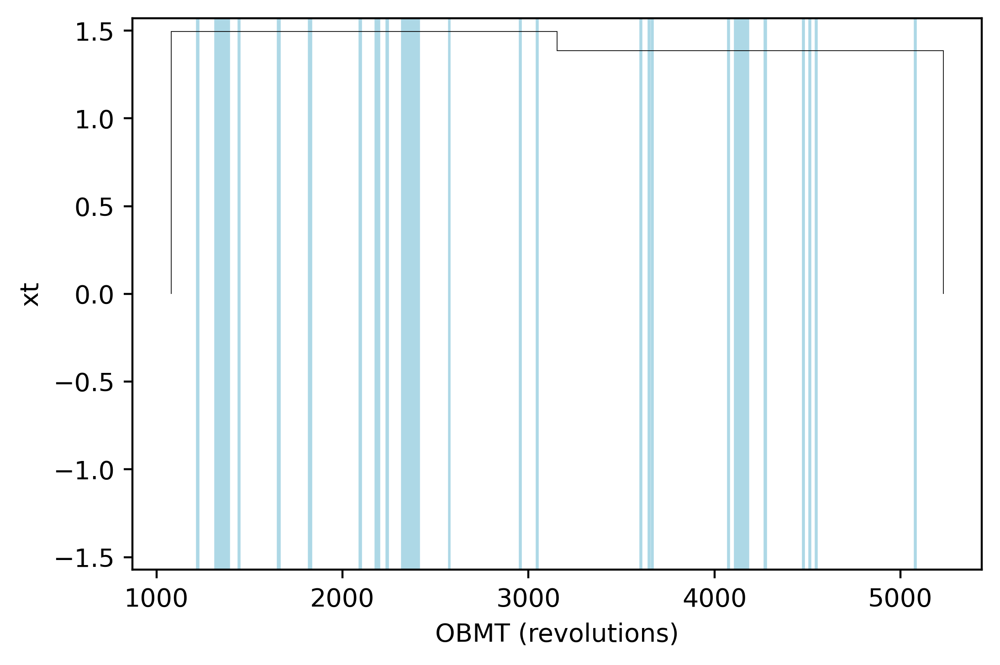

In [52]:
import pandas as pd

# Load in parameters
params = pd.read_csv('./data/Optimiser_Properties.dat',skipinitialspace=True)
Nt = params['Nt'][0]

# Load in transformed parameters
xt = pd.read_csv('./data/FinalPosition_TransformedParameters.dat',header=None)[0][:Nt].values

# Load in gaps
gaps = pd.read_csv('./data/edr3_gaps.csv')

# Plot
tbeg, tend = 1717.6256+(np.linspace(1666.4384902198801, 2704.3655735533684, 2) + 2455197.5 - 2457023.5 - 0.25)*4
bins = np.linspace(tbeg,tend,Nt+1)
plt.hist(0.5*(bins[1:]+bins[:-1]),bins = bins,weights=xt,lw=0.3,color='k',histtype='step')
for start,end in zip(gaps['tbeg'].values,gaps['tend'].values):
    plt.fill_between([start,end],y1=[-10,-10],y2=[10,10],color='lightblue')
plt.ylim([-1.05*np.abs(np.max(xt)),+1.05*np.abs(np.max(xt))])
plt.xlabel('OBMT (revolutions)')
plt.ylabel('xt')

In [50]:
np.diff(np.linspace(tbeg,tend,Nt+1))

array([2075.85416667, 2075.85416667])

In [51]:
np.linspace(tbeg,tend,Nt+1)

array([1078.37956088, 3154.23372755, 5230.08789421])

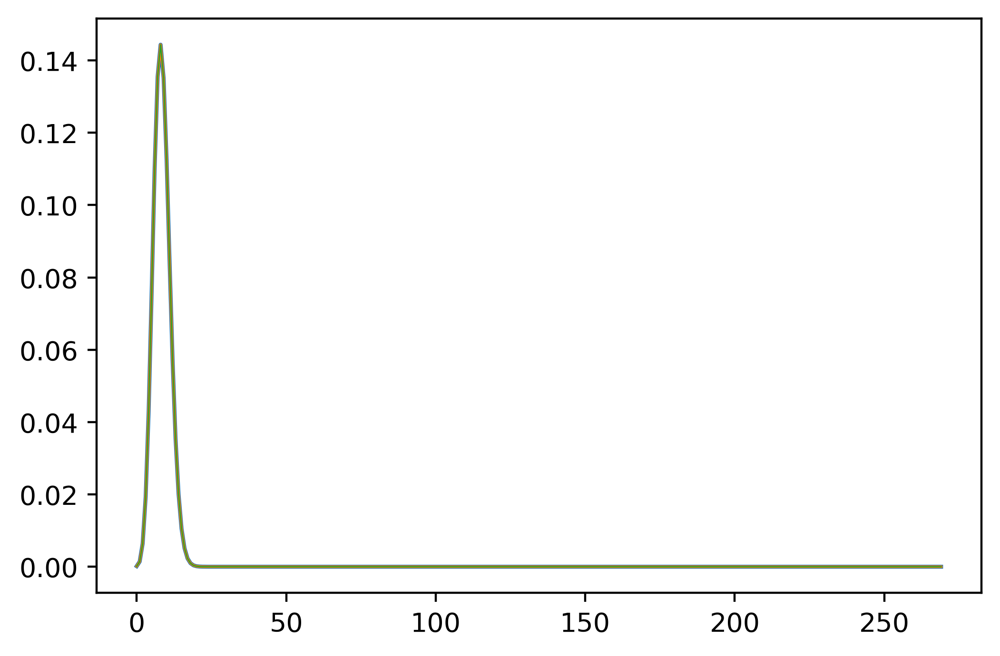

In [5]:
from poisson_binomial import poisson_binomial_pmf, poisson_binomial_pmf_forward, poisson_binomial_pmf_backward, poisson_binomial_subpmf
from poisson_binomial import poisson_binomial_lpmf_forward, poisson_binomial_lpmf_backward, poisson_binomial_sublpmf

c=5
if True: 
    k = 192
    n = 269
    p = np.zeros(n)
    p[:200] = 0.0065939
    p[200:] = 0.102494
elif False:
    n = 100
    k = 80
    p = np.zeros(n)
    p = np.random.uniform(0,0.001,n)
elif False:
    n = 114
    k = 81
    p = np.zeros(n)
    p[:36] = 0.669345
    p[36:] = 0.262181
elif False:
    n = 113
    k = 69
    p = np.zeros(n)
    p[:25] = 0.0504624
    p[25:] = 0.0258087
    0.694585
elif True:
    n = 72
    k = 51
    p = np.zeros(n)
    p[:15] = 0.364329
    p[15:] = 0.05463
else:
    n = 255
    k = 51
    p = np.random.uniform(0,1,n)
    
pmf_original = np.zeros(n+1)
poisson_binomial_pmf(p,n,pmf_original)
plt.plot(pmf_original)

pmf_forward = np.zeros((n,n+1))
poisson_binomial_pmf_forward(p,n,pmf_forward)
plt.plot(pmf_forward[-1],lw=1)

pmf_backward = np.zeros((n,n+1))
poisson_binomial_pmf_backward(p,n,pmf_backward)
plt.plot(pmf_backward[0],lw=0.5)

subpmf = np.zeros((n,n))
for i in range(n):
    poisson_binomial_subpmf(i,p,n,pmf_forward,pmf_backward,subpmf[:,i])
#poisson_binomial_subpmf(k-1,p,n,pmf_forward,pmf_backward,subpmf[1])
#poisson_binomial_subpmf(k,p,n,pmf_forward,pmf_backward,subpmf[2])

subpmfexact = np.zeros((n,n))
poisson_binomial_pmf(p[1:],n-1,subpmfexact[0,:])
poisson_binomial_pmf(p[:-1],n-1,subpmfexact[-1,:])
for i in range(1,n-1):
    poisson_binomial_pmf(np.concatenate([p[:i],p[i+1:]]),n-1,subpmfexact[i,:])
    
assert np.allclose(pmf_forward[-1],pmf_original)
assert np.allclose(pmf_backward[0],pmf_original)
for m in range(n):
    assert np.allclose(subpmf[m],subpmfexact[m])
    
lpmf_forward = np.zeros((n,n+1))
poisson_binomial_lpmf_forward(p,n,lpmf_forward)
assert np.allclose(pmf_forward[-1],np.exp(lpmf_forward[-1]))

lpmf_backward = np.zeros((n,n+1))
poisson_binomial_lpmf_backward(p,n,lpmf_backward)
assert np.allclose(pmf_backward[0],np.exp(lpmf_backward[0]))

sublpmf = np.zeros((n,n))
for i in range(n):
    poisson_binomial_sublpmf(i,p,n,lpmf_forward,lpmf_backward,sublpmf[:,i])
assert np.allclose(subpmf,np.exp(sublpmf))

In [8]:
np.log(1.53e-30)

-68.65228505441702

In [44]:
%%timeit
poisson_binomial_lpmf_forward(p,n,lpmf_forward)
poisson_binomial_lpmf_backward(p,n,lpmf_backward)
poisson_binomial_sublpmf(c-1,p,n,lpmf_forward,lpmf_backward,sublpmf[:,c-1])
poisson_binomial_sublpmf(k-1,p,n,lpmf_forward,lpmf_backward,sublpmf[:,k-1])
poisson_binomial_sublpmf(k,p,n,lpmf_forward,lpmf_backward,sublpmf[:,k])

228 µs ± 5.48 µs per loop (mean ± std. dev. of 7 runs, 1000 loops each)


In [45]:
%%timeit
poisson_binomial_pmf_forward(p,n,pmf_forward)
poisson_binomial_pmf_backward(p,n,pmf_backward)
poisson_binomial_subpmf(c-1,p,n,pmf_forward,pmf_backward,subpmf[:,c-1])
poisson_binomial_subpmf(k-1,p,n,pmf_forward,pmf_backward,subpmf[:,k-1])
poisson_binomial_subpmf(k,p,n,pmf_forward,pmf_backward,subpmf[:,k])

12 µs ± 156 ns per loop (mean ± std. dev. of 7 runs, 100000 loops each)


In [32]:
%timeit poisson_binomial_pmf_forward(p,n,pmf_forward)

46.6 µs ± 1.99 µs per loop (mean ± std. dev. of 7 runs, 10000 loops each)


In [34]:
%timeit poisson_binomial_subpmf(k,p,n,pmf_forward,pmf_backward,subpmf[:,k])

107 µs ± 1.99 µs per loop (mean ± std. dev. of 7 runs, 10000 loops each)


In [35]:
%timeit poisson_binomial_sublpmf(k,p,n,lpmf_forward,lpmf_backward,sublpmf[:,k])

556 µs ± 39.2 µs per loop (mean ± std. dev. of 7 runs, 1000 loops each)


In [28]:
np.exp(sublpmf)

array([[0.0001541 , 0.00141786, 0.00645255, ..., 0.        , 0.        ,
        0.        ],
       [0.0001541 , 0.00141786, 0.00645255, ..., 0.        , 0.        ,
        0.        ],
       [0.0001541 , 0.00141786, 0.00645255, ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.00017057, 0.00155101, 0.00697531, ..., 0.        , 0.        ,
        0.        ],
       [0.00017057, 0.00155101, 0.00697531, ..., 0.        , 0.        ,
        0.        ],
       [0.00017057, 0.00155101, 0.00697531, ..., 0.        , 0.        ,
        0.        ]])

In [27]:
subpmf

array([[0.0001541 , 0.00141786, 0.00645255, ..., 0.        , 0.        ,
        0.        ],
       [0.0001541 , 0.00141786, 0.00645255, ..., 0.        , 0.        ,
        0.        ],
       [0.0001541 , 0.00141786, 0.00645255, ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.00017057, 0.00155101, 0.00697531, ..., 0.        , 0.        ,
        0.        ],
       [0.00017057, 0.00155101, 0.00697531, ..., 0.        , 0.        ,
        0.        ],
       [0.00017057, 0.00155101, 0.00697531, ..., 0.        , 0.        ,
        0.        ]])

In [ ]:
for i in range(n):
    print(pmf_forward)

In [22]:
assert np.allclose(pmf_forward[-1],np.exp(lpmf_forward[-1]))

/Users/douglasboubert/anaconda3/envs/gaiaedr3/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: divide by zero encountered in log
  """Entry point for launching an IPython kernel.


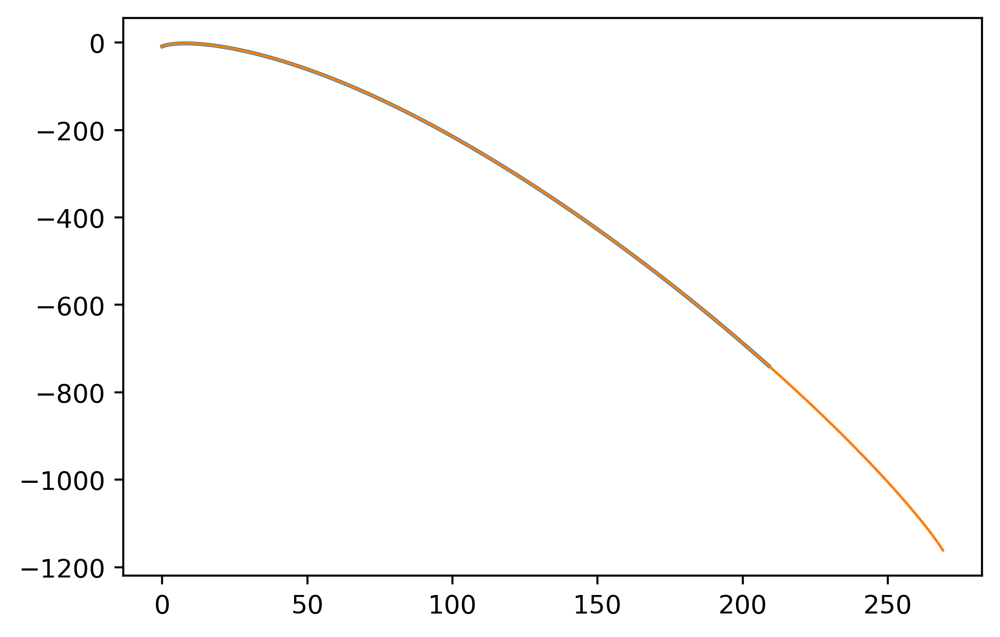

In [10]:
plt.plot(np.log(pmf_forward[-1]))
plt.plot(lpmf_forward[-1],lw=1)

In [ ]:
lmda = sum(p)
sigma2 = sum(p*(1-p))
P = sum(p)/n
s2 = sum(np.square(p-P))/n
kappa = lmda*(n-lmda)-sigma2
theta = -n*s2/kappa
print(P,theta)
def polya(k,P,n,theta):
    return special.binom(n,k)*np.prod([P+i*theta for i in range(k)])*np.prod([1.0-P+i*theta for i in range(n-k)])/np.prod([1.0+i*theta for i in range(n)])
polya_pmf = np.array([polya(k,P,n,theta) for k in range(n+1)])

In [ ]:
K = np.arange(0,n+1)
rate = sum(p)
plt.plot(K,pmf_original)
plt.plot(K,polya_pmf,lw=1)
plt.plot(K,stats.poisson(rate).pmf(K),lw=1)
plt.yscale('log')

In [ ]:
rate = sum(p)
#plt.hist(K,bins=np.arange(-0.5,n+1),weights=pmf_original,histtype='step')
plt.stairs(pmf_original,np.arange(-0.5,n+1))
K = np.arange(0,n+1)
from scipy import special,stats
#plt.hist(K,bins=np.arange(-0.5,n+1),weights=stats.poisson(rate).pmf(K),histtype='step')
#plt.hist(K,bins=np.arange(-0.5,n+1),weights=stats.binom(n=n,p=rate/n).pmf(K),histtype='step');
#plt.hist(K,bins=np.arange(-0.5,n+1),weights=stats.norm(loc=sum(p),scale=np.sqrt(sum(p*(1-p)))).pdf(K),histtype='step');
#plt.hist(K,bins=np.arange(-0.5,n+1),weights=polya_pmf,histtype='step');

plt.yscale('log')
plt.ylim([1e-100,1])

In [ ]:
rate

In [ ]:
0.5*(pmf_forward[-1,k]+pmf_backward[0,k])

In [ ]:
pmf_forward[-1,:]

In [ ]:
fig,(ax1,ax2) = plt.subplots(2,1)
m = 5
ax1.semilogy(subpmfexact[m])
ax1.semilogy(subpmf[m],lw=1)

ax2.plot((subpmf[m]-subpmfexact[m])/subpmfexact[m])
#plt.plot(subpmfexact[:,0],lw=1)
#plt.savefig('./tmp.png',dpi=300,bbox_inches='tight',facecolor="w")

In [ ]:
from poisson_binomial import poisson_binomial_pmf, poisson_binomial_pmf_forward, poisson_binomial_pmf_backward, poisson_binomial_subpmf, poisson_binomial_subpmf_fast
c=5
n = 200
k = 100
p = np.random.uniform(0,1,n)

pmf_original = np.zeros(n+1)
print('Original')
%time poisson_binomial_pmf(p,n,pmf_original)
plt.plot(pmf_original)

pmf_forward = np.zeros((n,n+1))
print('Forward')
%time poisson_binomial_pmf_forward(p,n,pmf_forward)
plt.plot(pmf_forward[-1],lw=1)

pmf_backward = np.zeros((n,n+1))
print('Backward')
%time poisson_binomial_pmf_backward(p,n,pmf_backward)
plt.plot(pmf_backward[0],lw=0.5)

subpmf = np.zeros(n)
print('Convolution')
%time poisson_binomial_subpmf(c-1,p,n,pmf_forward,pmf_backward,subpmf)
%time poisson_binomial_subpmf_fast(c-1,p,n,pmf_forward,pmf_backward,subpmf)

In [ ]:
%%timeit
poisson_binomial_pmf(p,n,pmf_original)

In [ ]:
%%timeit
poisson_binomial_pmf_forward(p,n,pmf_forward)

In [ ]:
%%timeit
poisson_binomial_pmf_backward(p,n,pmf_backward)

In [ ]:
%%timeit 
poisson_binomial_subpmf(c-1,p,n,pmf_forward,pmf_backward,subpmf)

In [ ]:
%%timeit
poisson_binomial_subpmf(k-1,p,n,pmf_forward,pmf_backward,subpmf)

In [ ]:
%%timeit
poisson_binomial_subpmf(k,p,n,pmf_forward,pmf_backward,subpmf)

In [ ]:
%%timeit
poisson_binomial_pmf_forward(p,n,pmf_forward)
poisson_binomial_pmf_backward(p,n,pmf_backward)
poisson_binomial_subpmf(c-1,p,n,pmf_forward,pmf_backward,subpmf)
poisson_binomial_subpmf(k-1,p,n,pmf_forward,pmf_backward,subpmf)
poisson_binomial_subpmf(k,p,n,pmf_forward,pmf_backward,subpmf)

In [ ]:
%%timeit
poisson_binomial_pmf_forward(p,n,pmf_forward)
poisson_binomial_pmf_backward(p,n,pmf_backward)
poisson_binomial_subpmf(c-1,p,n,pmf_forward,pmf_backward,subpmf)
poisson_binomial_subpmf(k-1,p,n,pmf_forward,pmf_backward,subpmf)
poisson_binomial_subpmf(k,p,n,pmf_forward,pmf_backward,subpmf)

In [ ]:
%timeit min(3.2,5.6)

In [ ]:
%timeit 3.2*5.6

In [ ]:
200*0.124

In [ ]:
pmf_original = np.zeros(n+1)
print('Original')
%time poisson_binomial_pmf(p,n,pmf_original)
%timeit poisson_binomial_pmf(p,n,pmf_original)
plt.plot(pmf_original)

pmf_forward = np.zeros((n,n+1))
print('Forward')
%time poisson_binomial_pmf_forward(p,n,pmf_forward)
%timeit poisson_binomial_pmf_forward(p,n,pmf_forward)
plt.plot(pmf_forward[-1],lw=1)

pmf_backward = np.zeros((n,n+1))
print('Backward')
%time poisson_binomial_pmf_backward(p,n,pmf_backward)
%timeit poisson_binomial_pmf_backward(p,n,pmf_backward)
plt.plot(pmf_backward[0],lw=0.5)

subpmf = np.zeros(n)
print('Convolution')
%time 

In [ ]:
from poisson_binomial import poisson_binomial_pmf

if True:
    n = 114
    k = 81
    p = np.zeros(n)
    p[:36] = 0.669345
    p[36:] = 0.262181
elif False:
    n = 113
    k = 69
    p = np.zeros(n)
    p[:25] = 0.0504624
    p[25:] = 0.0258087
    0.694585
elif False:
    n = 72
    k = 51
    p = np.zeros(n)
    p[:15] = 0.364329
    p[15:] = 0.05463
else:
    n = 255
    k = 51
    p = np.random.uniform(0,1,n)
pmf = np.zeros(n+1)
subpmf = np.zeros(n)
poisson_binomial_pmf(p,n,pmf)

likelihood = pmf[k];
	
correction = 1.0;
PipelineMinVisits = 5
for i in range(PipelineMinVisits):
    correction -= pmf[i]

gradient_first_term = 1.0
gradient_second_term = 1.0
if k == 0:
    gradient_first_term = 0.0
elif k == n:
    gradient_second_term = 0.0

log_likelihood = np.log(likelihood/correction)
gradient = np.zeros(n)

for i in range(n):

    inv_p = 1.0/(1.0 - p[i])

    subpmf[0] = pmf[0] * inv_p
    for j in range(1,n):
        subpmf[j] = (pmf[j] - subpmf[j-1]*p[i])*inv_p
    subpmf[n-1] = pmf[n]/p[i]

    gradient[i] = (gradient_first_term*subpmf[k-1]-gradient_second_term*subpmf[k])/likelihood - subpmf[PipelineMinVisits-1]/correction

subpmfexact = np.zeros(n)
poisson_binomial_pmf(p[1:],n-1,subpmfexact)

In [ ]:
for i in range(1,1):
    print(i)

In [ ]:
from poisson_binomial import poisson_binomial_pmf, poisson_binomial_pmf_simple
n = 114
k = 81
p = np.random.uniform(0,1,n)

pmf = np.zeros(n+1)
poisson_binomial_pmf(p,n,pmf)

pmf_simple = np.zeros(n+1)
poisson_binomial_pmf_simple(p,n,pmf_simple)
plt.plot(pmf)
plt.plot(pmf_simple,lw=1)

In [ ]:
import mpmath
mpmath.mp.dps = 1000
a = [mpmath.mpf(pmf[i]) for i in range(n+1)]
asum = mpmath.norm(a,p=1)
a = [a[i]/asum for i in range(n+1)]
b = [mpmath.mpf(0) for i in range(n)]
q = mpmath.fdiv(mpmath.mpf(p[i]),asum)
b[0] = mpmath.fdiv(a[0],mpmath.fsub(1.0,q))
for j in range(1,n):
    #b[j] = (a[j] - b[j-1]*q)/(1.0-q)
    b[j] = mpmath.fdiv(mpmath.fsub(a[j],mpmath.fmul(b[j-1],q)),mpmath.fsub(1.0,q))
    #b[j] = b[j-1] + (a[j] - b[j-1])/(1.0-q)


In [ ]:
b[-2]

In [ ]:
i = 0
inv_p = 1.0/(1.0 - p[i])
subpmf[0] = pmf[0] * inv_p
for j in range(1,n):
    subpmf[j] = (pmf[j] - subpmf[j-1]*p[i])*inv_p
subpmf[n-1] = pmf[n]/p[i]

gradient[i] = (gradient_first_term*subpmf[k-1]-gradient_second_term*subpmf[k])/likelihood - subpmf[PipelineMinVisits-1]/correction

subpmfexact = np.zeros(n)
poisson_binomial_pmf(p[1:],n-1,subpmfexact)

In [ ]:
i = 0
inv_p = 1.0/(1.0 - p[i])
subpmf = np.zeros(n)
subpmf[0] = pmf[0] * inv_p
subpmf[1] = (pmf[1] - subpmf[0]*p[i])*inv_p
for j in range(2,n):
    subpmf[j] = ((1.0-p[i])*pmf[j]-p[i]*pmf[j-1]+p[i]*p[i]*subpmf[j-2])*inv_p*inv_p
#subpmf[n-1] = pmf[n]/p[i]

gradient[i] = (gradient_first_term*subpmf[k-1]-gradient_second_term*subpmf[k])/likelihood - subpmf[PipelineMinVisits-1]/correction

subpmfexact = np.zeros(n)
poisson_binomial_pmf(p[1:],n-1,subpmfexact)

In [ ]:

plt.plot(subpmfexact)
plt.plot(subpmf,marker='o',ms=2,lw=1)
plt.ylim([-1,1])

In [ ]:
i = 0
inv_p = 1.0/(1.0 - p[i])

peak = int(sum(p)-p[i])
#peak = int(n/2)
subpmf[0] = pmf[0] * inv_p
for j in range(1,peak+1):
    subpmf[j] = (pmf[j] - subpmf[j-1]*p[i])*inv_p

subpmf[n-1] = pmf[n]/p[i]
for j in reversed(range(peak+2,n)):
    subpmf[j-1] = (pmf[j]-(1.0-p[i])*subpmf[j])/p[i]

gradient[i] = (gradient_first_term*subpmf[k-1]-gradient_second_term*subpmf[k])/likelihood - subpmf[PipelineMinVisits-1]/correction

subpmfexact = np.zeros(n)
poisson_binomial_pmf(p[1:],n-1,subpmfexact)

In [ ]:
i = 0
inv_p = 1.0/(1.0 - p[i])

#peak = int(sum(p))
if np.abs(p[i]/(1.0-p[i])) < 1.0:
    print('Forward')
    subpmf[0] = pmf[0] * inv_p
    for j in range(1,n):
        subpmf[j] = (pmf[j] - subpmf[j-1]*p[i])*inv_p
else:
    print('Backward')
    subpmf[n-1] = pmf[n]/p[i]
    for j in reversed(range(1,n)):
        subpmf[j-1] = (pmf[j]-(1.0-p[i])*subpmf[j])/p[i]

gradient[i] = (gradient_first_term*subpmf[k-1]-gradient_second_term*subpmf[k])/likelihood - subpmf[PipelineMinVisits-1]/correction

subpmfexact = np.zeros(n)
poisson_binomial_pmf(p[1:],n-1,subpmfexact)

In [ ]:
plt.plot(np.abs(subpmfexact))
plt.plot(np.abs(subpmf))
plt.yscale('log')

In [ ]:
plt.plot(subpmfexact)
plt.plot(np.abs((subpmf-subpmfexact)/subpmfexact))
plt.yscale('log')
#plt.ylim([-1,1])

In [ ]:
np.sum(pmf)

In [ ]:
i = 0
inv_1mp = 1.0/(1.0 - p[i])
inv_p = 1.0/p[i]


#peak = int(sum(p))
if p[i] < 0.5:
    print('Forward')
    subpmf[0] = pmf[0] * inv_1mp
    for j in range(1,n):
        print(p[i]*subpmf[j-1],pmf[j],abs((subpmf[j-1]-subpmfexact[j-1])/subpmfexact[j-1]))
        subpmf[j] = subpmf[j-1] + (pmf[j] - subpmf[j-1])*inv_1mp
        #subpmf[j] = (pmf[j] - p[i]*subpmf[j-1])*inv_1mp
else:
    print('Backward')
    subpmf[n-1] = pmf[n]*inv_p
    for j in reversed(range(1,n)):
        print(subpmf[j],(pmf[j] - subpmf[j])*inv_p)
        subpmf[j-1] = subpmf[j] + (pmf[j] - subpmf[j])*inv_p
gradient[i] = (gradient_first_term*subpmf[k-1]-gradient_second_term*subpmf[k])/likelihood - subpmf[PipelineMinVisits-1]/correction

subpmfexact = np.zeros(n)
poisson_binomial_pmf(p[1:],n-1,subpmfexact)

In [ ]:
subpmf[n-1],pmf[n]*inv_p

In [ ]:
# Branch + Neumaier

i = 0
inv_1mp = 1.0/(1.0 - p[i])
inv_p = 1.0/p[i]

#peak = int(sum(p))
c = 0
if np.abs(p[i]/(1.0-p[i])) < 1.0:
    print('Forward')
    subpmf[0] = pmf[0] * inv_1mp
    for j in range(1,n):
        inp = (pmf[j]-subpmf[j-1])*inv_1mp-c
        t = subpmf[j-1] + inp
        if abs(subpmf[j-1]) >= abs(inp):
            c = (subpmf[j-1]-t) + inp
            print(0,c)
        else:
            c = (inp - t) + subpmf[j-1]
            print(1,c)
        subpmf[j] = t
else:
    print('Backward')
    subpmf[n-1] = pmf[n]*inv_p
    for j in reversed(range(0,n)):
        subpmf[j-1] = (pmf[j]-(1.0-p[i])*subpmf[j])*inv_p

gradient[i] = (gradient_first_term*subpmf[k-1]-gradient_second_term*subpmf[k])/likelihood - subpmf[PipelineMinVisits-1]/correction

subpmfexact = np.zeros(n)
poisson_binomial_pmf(p[1:],n-1,subpmfexact)

In [ ]:
c

In [ ]:
plt.plot(subpmfexact)
plt.plot(subpmf)

In [ ]:
N = 10
p=0.3
K = np.zeros((N,N))
for i in range(N):
    for j in range(N):
        if i == j:
            K[i,j] = 1.0 - p
        elif i-j == 1:
            K[i,j] = p
print(K)
def sparse(M):
    M[np.abs(M)<1e-10] = 0.0
    print(M)
sparse(np.linalg.pinv(K))

In [ ]:
for i in range(n):
    print(subpmf[i],subpmfexact[i])
    if i ==k:
        print('here')

In [ ]:
gradient

In [ ]:
i = 0
inv_p = 1.0/(1.0 - p[i])

diffsubpmf = np.zeros(n)
diffpmf = np.zeros(n)
for j in range(1,n):
    diffpmf[j] = pmf[j]-pmf[j-1]

diffsubpmf[1] = (diffpmf[1]-p[i]*inv_p*pmf[0])*inv_p
for j in range(2,n):
    diffsubpmf[j] = (diffpmf[j]-p[i]*diffsubpmf[j-1])*inv_p
    

gradient[i] = -diffsubpmf[k]/likelihood - subpmf[PipelineMinVisits-1]/correction


In [ ]:
diffsubpmf

In [ ]:
plt.semilogy(pmf)

In [ ]:
from numba import njit
from math import tanh, exp

@njit
def sigmoid1(x):
    return 0.5*(1.0+tanh(0.5*x))

@njit
def sigmoid2(x):
    if x < 0:
        a = exp(x) 
        return a / (1 + a) 
    else:
        return 1 / (1 + exp(-x))

In [ ]:
x = -900
sigmoid1(x),sigmoid2(x)

In [ ]:
%timeit sigmoid1(100)

In [ ]:
%timeit sigmoid2(100)

In [ ]:
gaia = hp.read_map('densityMap-I_350_gaiaedr3-128.hpx', nest=True)

In [ ]:
hp.mollview(gaia,nest=True)

In [ ]:
p=0.05 at 100000 and p=0.95 at 1000

In [ ]:
log_gaia = np.log(gaia)
x = special.expit(10-log_gaia)

y = 1+(min(log_gaia)-log_gaia)/(max(log_gaia)-min(log_gaia))

In [ ]:
hp.mollview(special.expit(24-2.0*log_gaia),nest=True,min=0,max=1)

In [ ]:
import h5py
# Fake data
with h5py.File(f'./gaiaedr3_times_healpix_128_16.h5', 'r') as f:
    sox = {k:f[k][:] for k in f.keys()}
    print(sox.keys())

In [ ]:
xt = np.arange(NT)
t = np.arange(Nt)
r = Nt/NT

In [ ]:
T

In [ ]:
T*r

In [ ]:
time_shrink = 100
sox['fov_1_times']

In [ ]:
NT = 8967691
Nt = 1000
xt = 5.0*np.ones(Nt)
xt[100:200] = 0.0
xml = 
Nm = 20
Nstars = 1000



In [ ]:

gaiaedr3_times_healpix_128_16.h5

# Model

In [298]:
healpix_order = 2
needlet_order = 2

import pandas as pd
data = pd.read_csv(f'./ModelInputs/needlets_{healpix_order}_{needlet_order}.csv')
needlet_u = data['u'].values
needlet_v = data['v'].values
needlet_w = data['w'].values
needlet_n = needlet_w.size

lt = 96.0
lm = 3.0
Nm = 20
Nt = 360*6
healpix_nside = 2**healpix_order
Nl = 12*healpix_nside**2
Ns = 1
for i in range(needlet_order+1):
    Ns += 12*2**(2*i)

mut=5.0
sigmat=1.0

sigmam = 1.0

g = np.arange(Nm)
K = np.exp(-0.5*np.square(g[:,np.newaxis]-g[np.newaxis,:])/lm**2)
L = np.linalg.cholesky(K)*sigmam
z = np.random.normal(0,1,Nt+Ns*Nm)
#z = np.zeros(Nt+Ns*Nm)
#z[500] = 1.0

In [299]:

x = np.zeros(Nt+Nl*Nm)
b = np.zeros(Ns*Nm)

# Forward transformation
u = np.exp(-1.0/lt)
ua = 1.0/np.sqrt(1.0-u*u)
ub = -u*ua;

# Old
if True:
    previous = z[Nt-1] # First case is trivial
    x[Nt-1] = mut + sigmat * previous;
    for i in reversed(range(Nt-1)):    
        previous = (z[i] - ub * previous) / ua
        x[i] = mut + sigmat * previous
else:
    previous = z[0] # First case is trivial
    x[0] = mut + sigmat * previous;
    for i in range(1,Nt):    
        previous = (z[i] - ub * previous) / ua
        x[i] = mut + sigmat * previous

for s in range(Ns):
    for m in range(Nm):
        for n in range(Nm):
            b[s*Nm+m] += L[m,n] * z[Nt+s*Nm+n]

for i in range(needlet_n):
    for m in range(Nm):
        x[Nt+needlet_u[i]*Nm+m] += needlet_w[i]*b[needlet_v[i]*Nm+m]
        

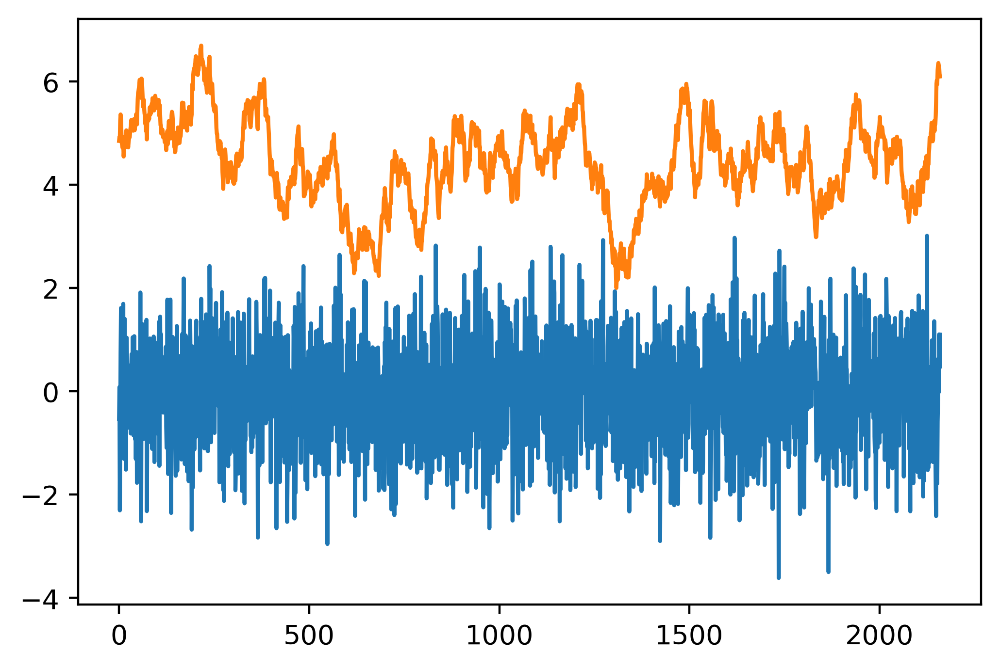

In [300]:
plt.plot(z[:Nt])
plt.plot(x[:Nt])

In [ ]:
needlet_n,Ns

In [ ]:
hp.mollview(x[Nt+10::Nm])

In [ ]:
""" For each Gaia chunk, compute n observations. """

import numpy as np
import sys
import tqdm
import pandas as pd
import os
import healpy as hp
from numba import njit
from math import sin, cos
from scipy import sparse
import copy
            
##### Load in sources and assign to bins
B = 2.0
p = 1.0
needle_sparse_tol = 1e-4
directory = './ModelInputs/'

# Check it exists, if not then create
if not os.path.exists(directory):
    os.makedirs(directory)

##### Load in data that all will need

# Function to compute needlet across sky
@njit
def pixel_space (Y, cos_gamma, window, start, end, legendre):
    '''Return the value of a needlet at gamma radians from the needlet centre.'''

    legendre[0] = 1.0
    legendre[1] = cos_gamma
    for cur_l in range(2, end + 1):
        legendre[cur_l] = ((cos_gamma * (2 * cur_l - 1) * legendre[cur_l - 1] - (cur_l - 1) * legendre[cur_l - 2])) / cur_l

    Y[:] = np.dot(window,legendre[start:end+1])
    
# Needlet weighting function
class chisquare:
    
    def __init__(self, p = 1.0, B = 2.0, F = 1e-6):
        self.p = p
        self.B = B
        self.F = F

    def window_function(self, l, j):
        u = l*(l+1) / np.power(self.B,2.0*j)
        return np.power(u,self.p)*np.exp(-u)*(2.0*l+1.0)/(4.0*np.pi)
            
    def start(self, j):
        return 1
    
    def end(self, j):
        from scipy import special
        G = -self.p*special.lambertw(-np.power(self.F,1.0/self.p)/np.e,k=-1).real*np.power(self.B,2.0*j)
        return int(np.ceil(0.5*(-1.0+np.sqrt(1.0+4.0*G))))
    
    def normalise(self, j):
        N = 0
        for l in np.arange(self.start(j), self.end(j) + 1, dtype = 'float'):
            N += self.window_function(l,j)
        return N
    
weighting = chisquare(p = p, B = B, F = 1e-4)

In [ ]:
healpix_order = 7
needlet_order = 6

# Compute locations of pixels
nside = hp.order2nside(healpix_order)
print(f'Working on order={healpix_order}, nside={nside}.')
npix = hp.nside2npix(nside)
colat, lon = np.array(hp.pix2ang(nside=nside,ipix=np.arange(npix),lonlat=False))
cos_colat, sin_colat = np.cos(colat), np.sin(colat)
cos_lon, sin_lon = np.cos(lon), np.sin(lon)

# Initialise variables
running_index = 0
needlet_w, needlet_v, needlet_u = [], [], []
Y = np.zeros(npix)
legendre = np.zeros((1+weighting.end(needlet_order),npix))

In [ ]:
needlet_nside = hp.order2nside(needlet_order)
needlet_npix = hp.nside2npix(needlet_nside)

start = weighting.start(needlet_order)
end = weighting.end(needlet_order)
modes = np.arange(start, end + 1, dtype = 'float')
window = np.sqrt(4.0*np.pi/needlet_npix)*weighting.window_function(modes,needlet_order)/weighting.normalise(needlet_order)

for needlet_ipix in [14000]:

    colat_needle, lon_needle = hp.pix2ang(nside=needlet_nside,ipix=needlet_ipix,lonlat=False)

    cos_gamma = cos(colat_needle) * cos_colat + sin(colat_needle) * sin_colat * (cos(lon_needle) * cos_lon + sin(lon_needle) * sin_lon)

    pixel_space(Y, cos_gamma = cos_gamma, window = window, start = start, end = end, legendre = legendre)

    _significant = np.where(np.abs(Y) > Y.max()*needle_sparse_tol)[0]
    needlet_w.append(Y[_significant])
    needlet_v.append(_significant)
    needlet_u.append(running_index)
    running_index += _significant.size

In [ ]:
np.min(Y),np.max(Y)

In [ ]:
hp.mollview(Y,cmap='RdBu_r',min=-np.max(Y),max=np.max(Y))

In [ ]:
import numpy as np
from scipy.spatial import cKDTree

a = np.random.normal(0,1,(999,10))
b = np.random.normal(0,1,(1001,10))
Nrandom = 100
for i,j in zip(np.random.randint(0,a.shape[0],Nrandom),np.random.randint(0,b.shape[0],Nrandom)):
    a[i]=b[j]


In [ ]:
%timeit D = np.all(a[:,np.newaxis,:] == b[np.newaxis,:,:],axis=2).astype(int)
D[123,345]

In [ ]:
%timeit D = np.all(np.isclose(a[:,np.newaxis,:],b[np.newaxis,:,:]),axis=2).astype(int)
D[123,345]

In [ ]:
%%timeit
from scipy.spatial import cKDTree
a_tree = cKDTree(a)
b_tree = cKDTree(b)
D = np.zeros((a.shape[0],b.shape[0]))
for ka,kb in a_tree.sparse_distance_matrix(b_tree,max_distance=1e-15).keys():
    D[ka,kb] = 1.0

In [ ]:
np.array(list(S.keys()))

In [ ]:
order = 12
nside = 128
print(hp.order2nside(order),2**order)
print(hp.nside2npix(nside),12*nside**2)

In [ ]:
hp.nside2resol(64,arcmin=True)

In [ ]:
hp.order2nside(5)

In [ ]:
import pandas as pd
data = pd.read_csv('./ModelInputs/needlets_2_2.csv')

from scipy import sparse
u = data['u'].values
v = data['v'].values
w = data['w'].values
S = 1+max(v)
L = 1+max(u)
Y = np.zeros((L,S))
for U,V,W in zip(u,v,w):
    Y[U,V] = W
z = np.random.normal(0,1,S)
hp.mollview(np.dot(Y,z))

In [ ]:
hp.mollview(Y[:,10])

In [ ]:
hp.order2nside(3), hp.nside2npix(8)*0.004

In [ ]:
vec = np.array([3.4,23,120])
#vec = vec/np.linalg.norm(vec)
hp.vec2pix(x=vec[0],y=vec[1],z=vec[2],nside=1024,nest=False)

In [ ]:
[1,2,3][0:0]

In [ ]:
pox = {}
import h5py

with h5py.File(f'./powermaps.h5', 'r') as f:
        
    # Load datasets
    for k in f.keys():
        pox[k] = f[k][:]

In [ ]:
scanninglaw_powerspectrum,scanninglaw_alm = hp.sphtfunc.anafast(hp.pixelfunc.reorder(pox['scanninglaw_map'],n2r=True),lmax=2048, alm=True)
sky_powerspectrum = np.zeros((11,scanninglaw_powerspectrum.size))
sky_alm = np.zeros((11,scanninglaw_alm.size))
for i in range(11):
    sky_powerspectrum[i],sky_alm[i] = hp.sphtfunc.anafast(hp.pixelfunc.reorder(pox['sky_map'][i],n2r=True),lmax=2048,alm=True)

In [ ]:
pox['sky_ma']

In [ ]:
plt.figure(figsize=(6,10))

for i in range(10):
    plt.plot(sky_powerspectrum[i]*(10**i/2),color=plt.cm.viridis(i/9),lw=1)

plt.plot(scanninglaw_powerspectrum/30,lw=1)
plt.yscale('log')
plt.xscale('log')
plt.xlabel('l')
plt.savefig('powerspectrum.png',dpi=300,bbox_inches='tight')

In [ ]:
replica = hp.sphtfunc.synfast(sky_powerspectrum[5], nside=1024, lmax=2048)
hp.mollview(replica)

In [ ]:
x = np.random.normal(0,1,100000000)
x[10:] = np.nan

In [ ]:
np.nanpercentile(x,90)

In [ ]:
%time %run GenerateSphericalHarmonics.py 128 50

In [ ]:
with h5py.File(f'sphericalharmonics_nside{128}_lmax{5}.h5', 'r') as f:
    Ylm = f['Ylm'][:]
    l = f['l'][:]
    m = f['m'][:]

In [ ]:
np.linalg.svd(Ylm)

In [ ]:
alm = np.random.normal(0,10/(1+l)**2,l.size)
hp.mollview(np.dot(alm,Ylm),nest=True)
#plt.savefig('./tmp.png',dpi=300,bbox_inches='tight')

In [ ]:
%%time
nside = 128
lmax = 5
Npix = hp.nside2npix(nside)

# Form the l's and m's
l = np.concatenate([np.repeat(_l,2*_l+1) for _l in range(lmax+1)]).astype(np.int)
m = np.concatenate([np.arange(-_l,_l+1e-9) for _l in range(lmax+1)]).astype(np.int)
Nmodes = int((lmax+1)**2)

# Calculate the colatitudes and longitudes of the healpix pixels
colat,lon = hp.pix2ang(nside=nside,ipix=np.arange(Npix),lonlat=False,nest=True)

# Compute the complex Ylm's
#Ylm_complex = np.zeros((Npix,Nmodes), dtype=complex)
#for ipix in range(Npix):
#    Ylm_complex[ipix] =  special.sph_harm(m, l, lon[ipix], colat[ipix])
Ylm_complex = special.sph_harm(m[None,:], l[None,:], lon[:,None], colat[:,None])

# Transform to real Ylm's
Ylm_real = np.zeros((Npix,Nmodes), dtype=np.float)
#Ylm_real[:,m<0] = np.sqrt(2)*np.power(-1,-m[m<0])*Ylm_complex.imag[:,m<0]
Ylm_real[:,m<0] = -np.sqrt(2)*Ylm_complex.imag[:,m<0]
Ylm_real[:,m==0] = Ylm_complex.real[:,m==0]
Ylm_real[:,m>0] = np.sqrt(2)*np.power(-1,m[m>0])*Ylm_complex.real[:,m>0]

In [ ]:
# generate sph harm grid
nside = 128
lmax = 5
Npix = hp.nside2npix(nside)

# Form the l's and m's
l_hp,m_hp = hp.sphtfunc.Alm.getlm(lmax=lmax)
Nmodes = int((lmax+1)*(lmax+2)/2)
assert l_hp.size == Nmodes

Ylm_grid = np.zeros((2*Nmodes, Npix))
for ii in tqdm.tqdm(range(Nmodes)):
    alm_grid = np.zeros(Nmodes)
    alm_grid[ii] = 1
    Ylm_grid[ii] = hp.pixelfunc.reorder(hp.sphtfunc.alm2map(alm_grid+0.j*alm_grid,nside=nside,verbose=False), r2n=True)
    Ylm_grid[Nmodes+ii] = -hp.pixelfunc.reorder(hp.sphtfunc.alm2map(0.*alm_grid+1.j*alm_grid,nside=nside,verbose=False), r2n=True)
    
    

In [ ]:
l,l_hp

In [ ]:
m,m_hp

In [ ]:
_l,_m = 5,3
my_idx = np.where((l==_l) & (m == _m))[0]
hp_idx = np.where((l_hp==_l) & (m_hp == _m))[0]
print(my_idx,hp_idx)
print(Ylm_real[10,my_idx],Ylm_grid[hp_idx,10]/np.sqrt(2))

_l,_m = 5,-3
my_idx = np.where((l==_l) & (m == _m))[0]
hp_idx = np.where((l_hp==_l) & (m_hp == -_m))[0]+int((lmax+1)*(lmax+2)/2)
print(my_idx,hp_idx)
print(Ylm_real[10,my_idx],Ylm_grid[hp_idx,10]/np.sqrt(2))

In [ ]:
Ylm_real[10,my_idx],Ylm_grid[hp_idx,10]/np.sqrt(2)

In [ ]:
%%time
nside = 128
lmax = 100
Npix = hp.nside2npix(nside)

# Form the l's and m's
l = np.concatenate([np.repeat(_l,2*_l+1) for _l in range(lmax+1)]).astype(np.int)
m = np.concatenate([np.arange(-_l,_l+1e-9) for _l in range(lmax+1)]).astype(np.int)
l_hp,m_hp = hp.sphtfunc.Alm.getlm(lmax=lmax)
Nmodes = int((lmax+1)**2)
Nmodes_healpy = int((lmax+1)*(lmax+2)/2)

Ylm = np.zeros((Nmodes,Npix))
alm_hp = np.zeros(Nmodes_healpy)
for i,(_l,_m) in enumerate(zip(tqdm.tqdm(l),m)):
    if _m > 0.0:
        hp_idx = np.where((l_hp==_l) & (m_hp == _m))[0]#+int((lmax+1)*(lmax+2)/2)
        alm_hp[hp_idx] = 1.0
        Ylm[i] = np.power(-1,_m)*hp.pixelfunc.reorder(hp.sphtfunc.alm2map(alm_hp+0.j*alm_hp,nside=nside,verbose=False)/np.sqrt(2), r2n=True)
        alm_hp[hp_idx] = 0.0
    elif _m < 0.0:
        hp_idx = np.where((l_hp==_l) & (m_hp == -_m))[0]#+int((lmax+1)*(lmax+2)/2)
        alm_hp[hp_idx] = 1.0
        Ylm[i] = np.power(-1,-_m+1)*hp.pixelfunc.reorder(hp.sphtfunc.alm2map(0.*alm_hp+1.j*alm_hp,nside=nside,verbose=False)/np.sqrt(2), r2n=True)
        alm_hp[hp_idx] = 0.0
    else:
        hp_idx = np.where((l_hp==_l) & (m_hp == 0))[0]
        alm_hp[hp_idx] = 1.0
        Ylm[i] = hp.pixelfunc.reorder(hp.sphtfunc.alm2map(alm_hp+0.j*alm_hp,nside=nside,verbose=False), r2n=True)
        alm_hp[hp_idx] = 0.0

In [ ]:
m

In [ ]:
np.allclose(Ylm_real.T,Ylm)

In [ ]:
Ylm

In [ ]:
alm = np.random.normal(0,10/(1+l)**1.4,Nmodes*2)
hp.mollview(np.dot(alm,Ylm_grid),nest=True)
#plt.savefig('./tmp.png',dpi=300,bbox_inches='tight')

In [ ]:
Ylm_grid[99+Nmodes]

In [ ]:
np.where((l==5)&(m==0))

In [ ]:
l.size,Nmodes,int((lmax+1)*(lmax+2)/2)

In [ ]:
hp.sphtfunc.alm2map(1.9+0.j,nside=nside,verbose=False)

In [ ]:
_l = 13
_m = 3
special.sph_harm(_m, _l, lon[123], colat[123]),special.sph_harm(-_m, _l, lon[123], colat[123])

In [ ]:
np.where(())

In [ ]:
Ylm_complex[100,456],special.sph_harm(m[456], l[456], lon[100], colat[100])

In [ ]:
Ylm_real[:,idx]

In [ ]:
special.sph_harm(+30, 32, lon[ipix], colat[ipix])

In [ ]:
idx = 124
print(l[idx],m[idx])
hp.mollview(Ylm_real[:,idx],nest=True)

In [ ]:
l

In [ ]:
alm = np.random.normal(0,10/(1+l)**1.4,Nmodes)
hp.mollview(np.dot(Ylm_real,alm),nest=True)
#plt.savefig('./tmp.png',dpi=300,bbox_inches='tight')

In [ ]:
A = np.random.normal(0,1,(400,200000))

In [ ]:
%timeit A.sum(axis=0)

In [ ]:
lmax = 4
(lmax)*(lmax-1)/2

In [ ]:
lmax = 200
_alm = hp.sphtfunc.synalm(np.random.normal(0,10.0/np.arange(1,lmax+1)**5.0,lmax),new=True)
_map = hp.sphtfunc.alm2map(_alm,nside=128)
hp.mollview(_map)

In [ ]:
lmax = 200
l = hp.sphtfunc.Alm.getlm(lmax=lmax-1)[0]
scale = 10.0/(1.0+l)**2
_alm = np.random.normal(0,scale,int(lmax*(lmax+1)/2)) + 1j*np.random.normal(0,scale,int(lmax*(lmax+1)/2))
_map = hp.sphtfunc.alm2map(_alm,nside=256)
hp.mollview(_map)